In [2]:
%load_ext autoreload
%load_ext pycodestyle_magic
%flake8_on --max_line_length 119
%autoreload 2

In [3]:
import tensorflow as tf
from openalpr import Alpr
import pickle
import io
import time
import re
from google.cloud import vision
from difflib import SequenceMatcher
import tesserocr
from tesserocr import PyTessBaseAPI
import sys
import os
import numpy as np
from numpy import expand_dims
from mrcnn.config import Config
from mrcnn.model import MaskRCNN
from matplotlib.patches import Rectangle
import matplotlib.pyplot as plt
import cv2
from mrcnn.model import mold_image
from PIL import Image, ImageEnhance, ImageFilter
import pytesseract
sys.path.append(os.path.dirname(os.path.dirname(os.path.abspath('.../'))))
import Detection # noqa
from Utility.ImageProcessing import * # noqa
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
# Change path to your own tesseract installation.
# Tesseract installation: https://github.com/tesseract-ocr/tesseract
pytesseract.pytesseract.tesseract_cmd = r"C:\Program Files\Tesseract-OCR\tesseract.exe"

Using TensorFlow backend.


# Model Inladen

In [5]:
model_vers1, cfg = Detection.LoadModel('mask_rcnn_plate_cfg_0100.h5')
model_vers2, cfg = Detection.LoadModel('mask_rcnn_plate_cfg_0030.h5')
model_vers3, cfg = Detection.LoadModel('mask_rcnn_plate_cfg_vers2_00100.h5')

mask_rcnn_plate_cfg_0100.h5
mask_rcnn_plate_cfg_0030.h5
mask_rcnn_plate_cfg_vers2_00100.h5


# Kenteken Detectie

In [6]:
def Detect_Plates(img, model, name, debug=False):
    """
    Function to pre-detect license plates for Tesseract. Each crop is saved in a folder.
    One has to manually delete crops with out license plates and rename them by hand.

    :param img: path to image
    :param model: Mask RCNN model
    :param name: name of file (failed attempted at automatizing naming process)
    :param debug: debug mode. if on Mask RCNN will show results of detection

    :type img: string
    :type model: string
    :type name: int
    :type debug: bool

    :return name: where the counter for name is currently at
    :return end: time it took to detect plates

    :rtype name: int
    :rtype end: float
    """
    start = time.time()
    boxes, img = Detection.predict_once(img, model, cfg, debug=False)
    end = time.time() - start

    first_c = first_crops(img, boxes)

    for crop in first_c:
        second_crop = secondCrop(crop)
        contrasted_img = increase_contrast_2(increase_contrast_1(second_crop))
        contrasted_img = apply_brightness_contrast(contrasted_img, brightness=-50, contrast=30)

        file_name = str(name)
        file_name = file_name.zfill(3)
        cv2.imwrite("../Dataset/TesseractEvaluation/"+file_name+".jpg", contrasted_img)
        plt.imshow(cv2.cvtColor(second_crop, cv2.COLOR_BGR2RGB))
        plt.show()
        name += 1
    return name, end

In [7]:
def Detect_Plates_In_Folder(model, path=r"../Dataset/MaskRCNNEvaluation/"):
    """Function to detect all plates in a folder

    :param model: the model to be evaluated
    :param path: path to the folder containing the pictures with plates

    :type model: MaskRCNN
    :type path: string

    :return (sum(times))/(len(times)): average time it took detect plates
    :rtype: float
    """
    counter = 0
    files = os.listdir(path)
    times = []

    for pic in sorted(files):
        filename = os.fsdecode(pic)
        pic_path = path + filename
        print(pic_path)
        counter, time_spend = Detect_Plates(pic_path, model, counter, debug=False)
        times.append(time_spend)
    return (sum(times)/len(times))

In [8]:
def Tesseract_Evaluation(img, debug=False, plate_num=None, lang="plate_model_4", tess=False):
    """
    Function to evaluate one reading of Tesseract.
    Both speed and accuracy are evaluated once here.

    :param img: path to the image to be read from
    :param debug: debug mode
    :param plate_num: the correct plate number on the image
    :param lang: Tesseract language

    :type img: string
    :type debug: bool
    :type plate_num: string
    :type lang: string

    :rtype (total_speed, total_accuracy): Tuple with floats
    """
    contrasted_img = cv2.imread(img)
    plt.imshow(contrasted_img)
    plt.show()

    total_speed = [0, 0]
    total_accuracy = [0, 0]

    start_time = time.time()
    if tess:
        plates = Tesser_OCR(contrasted_img, lang)
    else:
        plates = Detection.Tesseract_OCR(contrasted_img, lang)
    speed = round(time.time() - start_time, 3)
    print("Plates found: " + str(plates))
    print(plate_num)
    plate_num = re.sub(r'[^\w]', '', plate_num)
    if len(plates) > 0:
        max_accuracy = max([SequenceMatcher(None, plate_num, re.sub(r'[^\w]', '', x)).ratio() for x in plates])
        total_accuracy[0] += max_accuracy
        total_accuracy[1] += 1
        print("Max accuracy: " + str(max_accuracy))
        print("Speed: " + str(speed))
        print()
    total_speed[0] += speed
    total_speed[1] += 1

    return (total_speed, total_accuracy)

In [9]:
def Tesseract_Complete_Evaluation(folder, lang="plate_model_4", tess=False):
    """
    Function that evaluates an entire Tesseract language.

    :param folder: folder to read the pictures from
    :param lang: Tesseract language

    :type folder: string
    :type lang: string
    """
    path = r"../Dataset/TesseractEvaluation/evaluation/"+folder
    counter = 0

    tesseract_speed = 0
    tesseract_accuracy = 0
    tesseract_speed_counter = 0
    tesseract_accuracy_counter = 0
    files = os.listdir(path)

    for pic in sorted(files):
        filename = os.fsdecode(pic)
        pic_path = path + filename
        print(pic_path)
        result = Tesseract_Evaluation(pic_path, debug=False, plate_num=plates[counter][0], lang=lang, tess=tess)
        tesseract_speed += result[0][0]
        tesseract_speed_counter += result[0][1]

        tesseract_accuracy += result[1][0]
        tesseract_accuracy_counter += result[1][1]

        counter += 1

    print("Average time: " + str(tesseract_speed/tesseract_speed_counter))
    print("Average accuracy: " + str(tesseract_accuracy/tesseract_accuracy_counter))

In [10]:
def Tesser_OCR(img, lang):
    """
    Function to read text on images with tesser-ocr

    :param img: the image that needs to be read from
    :param lang: language for Tesseract to use
    :type img: cv2
    :type lang: string

    :return plates: the plates that were detected
    :rtype plates: string list
    """
    im_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    (thresh, im_bw) = cv2.threshold(im_gray, 128, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    plates = []
    for i in range(20, 70, 5):
        im_bw = cv2.threshold(im_gray, thresh + i, 255, cv2.THRESH_BINARY)

        plate_crop = Image.fromarray(im_bw[1])
        new_size = tuple(14*x for x in plate_crop.size)
        resized_img = plate_crop.resize(new_size, Image.ANTIALIAS)

        text = tesserocr.image_to_text(resized_img, lang="plate_model",
                                       path=r"C:\Program Files\Tesseract-OCR\tessdata",
                                       psm=10)
        plates.append(re.sub('[\n-\x0c]',  '', text))

    plates = list(set(plates))
    return plates

# Mask RCNN Model 1

In [49]:
plates = [
         ["56-TK-JL"], ["07-NJB-5"],
         ["17-HK-LG"], ["9-XHP-78"],
         ["76-XJ-XP"], ["TX-979-F"], ["24-XV-LZ"],
         ["TX-882-S"], ["92-RZ-XZ"], ["29-JTF-7"], ["8-ZKX-27"], ["29-LJK-3"],
         ["G-499-KH"], ["KF-544-F"], ["56-ZF-DL"], ["G-499-KH"],
         ["GL-395-X"],
         ["80-XB-FD"], ["GL-805-X"], ["ST-185-K"], ["5-XZV-10"],
         ["XT-567-K"],
         ["KD-362-J"],
         ["53-SK-KB"], ["84-KLJ-9"], ["47-JR-LV"], ["92-NP-LR"], ["31-PX-KR"],
         ["KN-621-V"], ["BX-41-PZ"],
         ["GX02 BCF"], ["H 786 POJ"]
]
print(len(plates))

32


../Dataset/MaskRCNNEvaluation/001.jpg


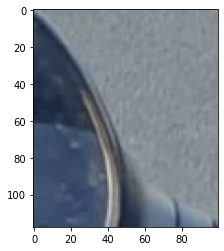

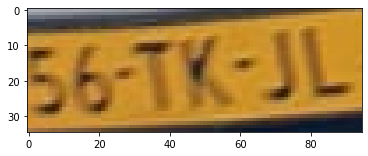

../Dataset/MaskRCNNEvaluation/002.jpg


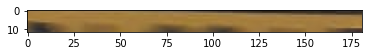

../Dataset/MaskRCNNEvaluation/003.jpg


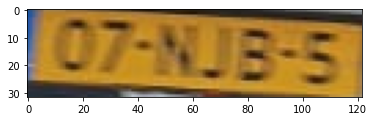

../Dataset/MaskRCNNEvaluation/004.jpg


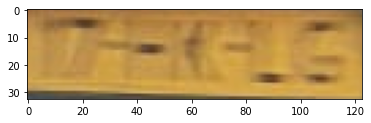

../Dataset/MaskRCNNEvaluation/005.jpg


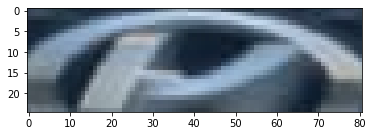

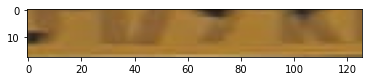

../Dataset/MaskRCNNEvaluation/006.jpg


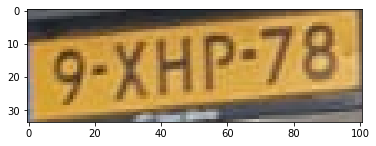

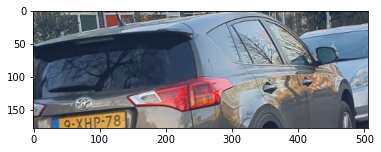

../Dataset/MaskRCNNEvaluation/007.jpg


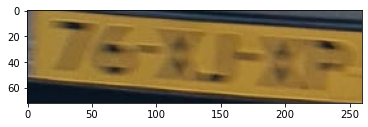

../Dataset/MaskRCNNEvaluation/008.jpg


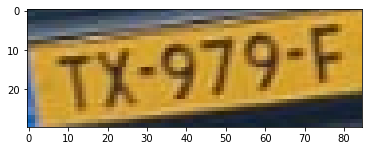

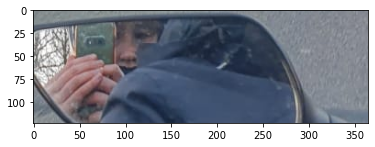

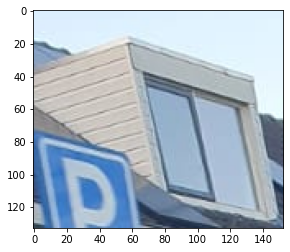

../Dataset/MaskRCNNEvaluation/009.jpg


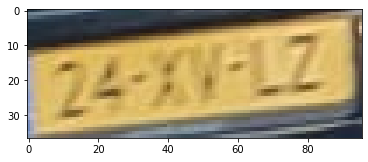

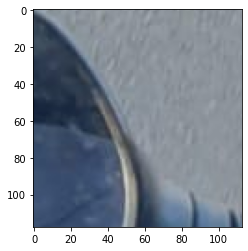

../Dataset/MaskRCNNEvaluation/010.jpg


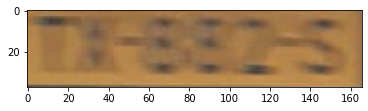

../Dataset/MaskRCNNEvaluation/011.jpg


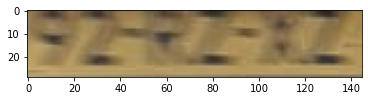

../Dataset/MaskRCNNEvaluation/012.jpg


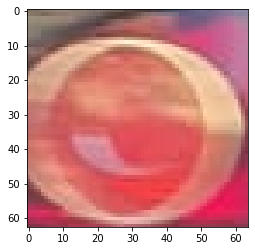

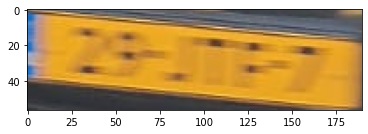

../Dataset/MaskRCNNEvaluation/013.jpg


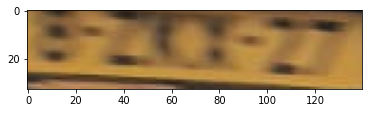

../Dataset/MaskRCNNEvaluation/014.jpg
../Dataset/MaskRCNNEvaluation/015.jpg
../Dataset/MaskRCNNEvaluation/016.jpg


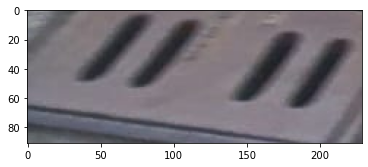

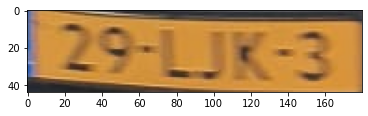

../Dataset/MaskRCNNEvaluation/017.jpg


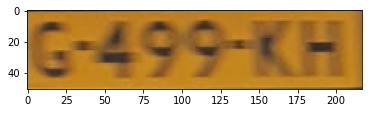

../Dataset/MaskRCNNEvaluation/018.jpg


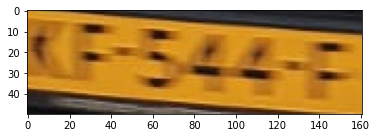

../Dataset/MaskRCNNEvaluation/019.jpg
../Dataset/MaskRCNNEvaluation/020.jpg


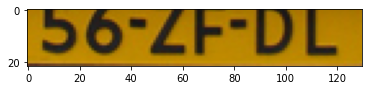

../Dataset/MaskRCNNEvaluation/021.JPG


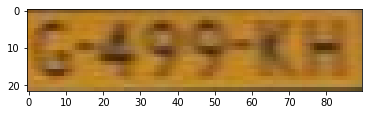

../Dataset/MaskRCNNEvaluation/022.jpg


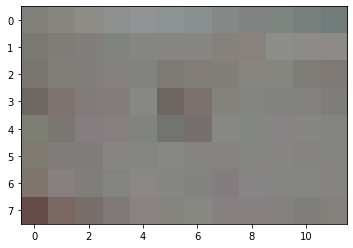

../Dataset/MaskRCNNEvaluation/023.jpg


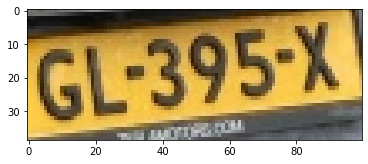

../Dataset/MaskRCNNEvaluation/024.jpg


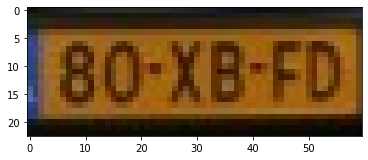

../Dataset/MaskRCNNEvaluation/025.jpg


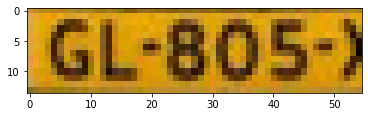

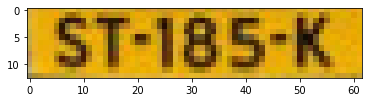

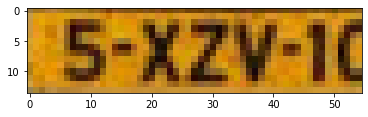

../Dataset/MaskRCNNEvaluation/026.JPG


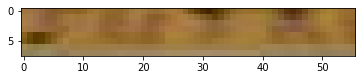

../Dataset/MaskRCNNEvaluation/027.jpg


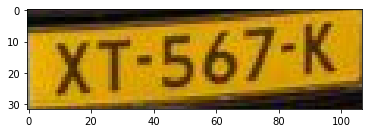

../Dataset/MaskRCNNEvaluation/028.jpg


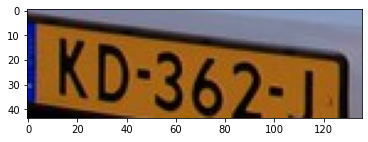

../Dataset/MaskRCNNEvaluation/029.jpg
../Dataset/MaskRCNNEvaluation/030.jpg
../Dataset/MaskRCNNEvaluation/031.jpg


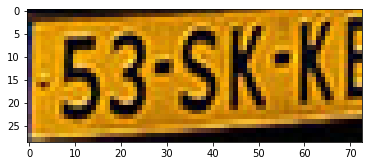

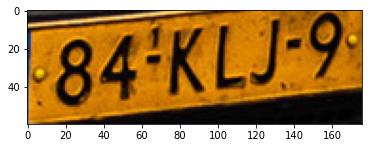

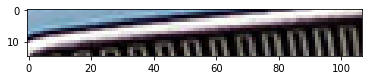

../Dataset/MaskRCNNEvaluation/032.jpg


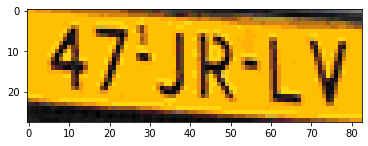

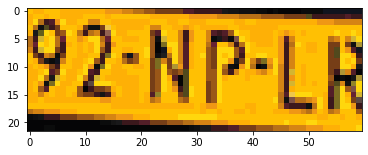

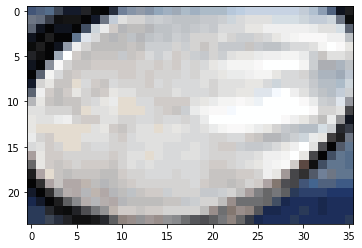

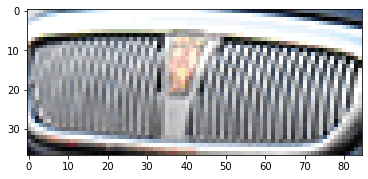

../Dataset/MaskRCNNEvaluation/033.jpg


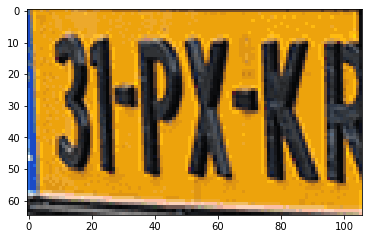

../Dataset/MaskRCNNEvaluation/034.jpg


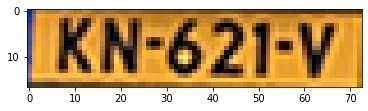

../Dataset/MaskRCNNEvaluation/035.jpg


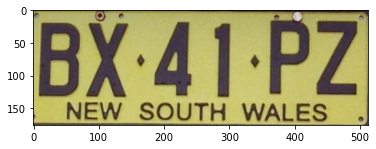

../Dataset/MaskRCNNEvaluation/036.jpg


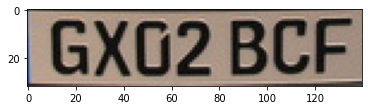

../Dataset/MaskRCNNEvaluation/037.jpg


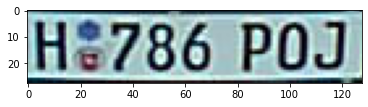

6.640728905394271

In [50]:
Detect_Plates_In_Folder(model_vers1)

In [52]:
print(sum(times)/len(times))

5.754906145302025


../Dataset/TesseractEvaluation/evaluation/model_1/001.jpg


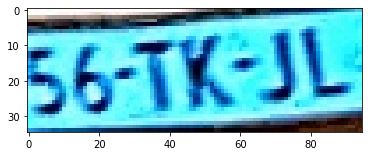

Plates found: ['56-TE-3L', 'L6-TR-3L', '56-TK-3L', '56-TR-3L']
56-TK-JL
Max accuracy: 0.8333333333333334
Speed: 5.357

../Dataset/TesseractEvaluation/evaluation/model_1/003.jpg


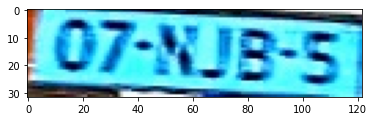

Plates found: ['07-X-JB-5', '07-XJB-S', 'C7-X-IB-5', 'C7-X12-5', '07-K-JB-5', '07-XJB-5', '07-KJB-5']
07-NJB-5
Max accuracy: 0.8333333333333334
Speed: 5.383

../Dataset/TesseractEvaluation/evaluation/model_1/004.jpg


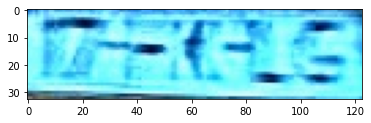

Plates found: ['F7-T1-T-C1', 'IFC-CT-C', 'I722-6-Z5', 'T2Z1-LZ', 'T7Z1-L-Z', 'FFZC-L-Z']
17-HK-LG
Max accuracy: 0.3333333333333333
Speed: 6.834

../Dataset/TesseractEvaluation/evaluation/model_1/007.jpg


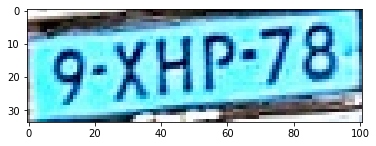

Plates found: ['9-XHP-Z8', '9-XHP-78', '7-XHP-78', 'G-XHP-78', 'G-XHP-Z8']
9-XHP-78
Max accuracy: 1.0
Speed: 6.22

../Dataset/TesseractEvaluation/evaluation/model_1/009.jpg


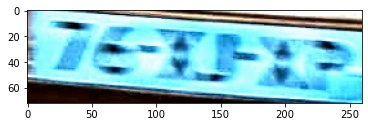

Plates found: ['7Z-TE-3S', '7Z-TF3T', '7Z-TF2T', 'LZZ-TE-TT', 'LC-TT-1T']
76-XJ-XP
Max accuracy: 0.16666666666666666
Speed: 7.805

../Dataset/TesseractEvaluation/evaluation/model_1/010.jpg


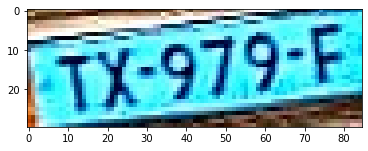

Plates found: ['TY-973E', 'TY-973-E', 'TY-972-E', 'TY-979E', 'TY-972E']
TX-979-F
Max accuracy: 0.6666666666666666
Speed: 4.966

../Dataset/TesseractEvaluation/evaluation/model_1/013.jpg


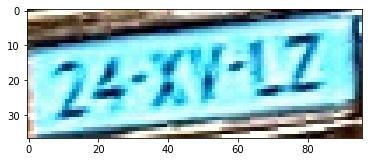

Plates found: ['Z2-X7-LZ-J', 'Z-11-LZ-J', '72-77-LZJ', 'Z-X7-LZ-J', 'ZZ-17-LZ-J', '72-77-LLJ', '7-71-LZ-J', '7-X7-LZ-J', '7-77-LLJ']
24-XV-LZ
Max accuracy: 0.6153846153846154
Speed: 5.571

../Dataset/TesseractEvaluation/evaluation/model_1/015.jpg


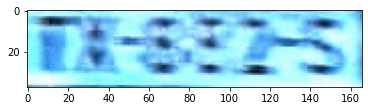

Plates found: ['TE-8Z2-SI', 'IEE-EEZ-S', 'TE-8Z2-S', 'TX-S-2Z-S', 'TZ-S3-Z-S', 'EK-EZZ-S', 'TK-E-2Z-S', 'TX-EZ2-S1']
TX-882-S
Max accuracy: 0.6666666666666666
Speed: 5.908

../Dataset/TesseractEvaluation/evaluation/model_1/016.jpg


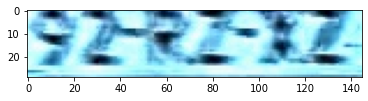

Plates found: ['9Z-KZ-KZ', 'TZ-KZ-EZ', '9Z-RZ-ZZ', 'Z-Z-X-C-KZ', '9Z-BZ-ZZ', 'ZYZ-X-XZ', '9Z-RZ-KZ', 'SZ-RZ-KZ', 'SZ-KZ-EZ']
92-RZ-XZ
Max accuracy: 0.6666666666666666
Speed: 5.607

../Dataset/TesseractEvaluation/evaluation/model_1/018.jpg


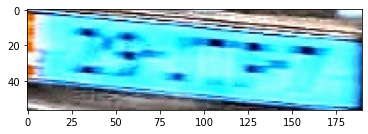

Plates found: ['LZZ-ZZ-1']
29-JTF-7
Max accuracy: 0.0
Speed: 6.74

../Dataset/TesseractEvaluation/evaluation/model_1/019.jpg


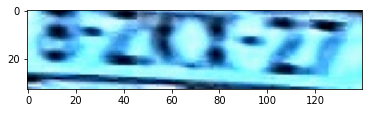

Plates found: ['S-ZXX-Z7', 'S-XXY-Z7', 'S-ZKZ-Z7', 'S-ZLZ-Z7', 'Z-ZCY-Z7', 'Z-ZCY-ZT', 'Z-XCXY-Z7']
8-ZKX-27
Max accuracy: 0.5
Speed: 5.263

../Dataset/TesseractEvaluation/evaluation/model_1/021.jpg


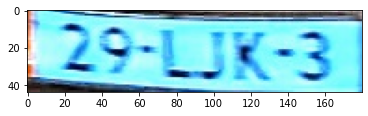

Plates found: ['L29-L3K-37', 'L29-L-JK-31', 'L29-L-3K-3', 'LZS-L-3X-3']
29-LJK-3
Max accuracy: 0.8571428571428571
Speed: 5.934

../Dataset/TesseractEvaluation/evaluation/model_1/022.jpg


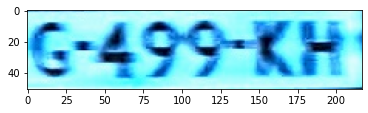

Plates found: ['GC-499-KH', 'G-499-KH', 'G-499-EH', 'C-499-KP', 'C-499-KF']
G-499-KH
Max accuracy: 1.0
Speed: 6.288

../Dataset/TesseractEvaluation/evaluation/model_1/023.jpg


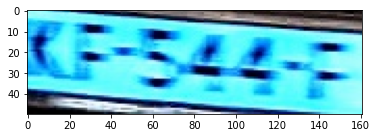

Plates found: ['5-Z-SZ4-C', 'LZ-S44-C', '8Z-ZLZ-Z', 'LC-SZ4-C', 'LZ-Z4Z-Z']
KF-544-F
Max accuracy: 0.3333333333333333
Speed: 5.611

../Dataset/TesseractEvaluation/evaluation/model_1/024.jpg


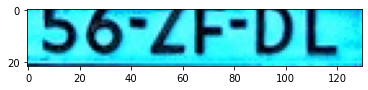

Plates found: ['9O-ZF-UL', '9O-ZF-UUL', 'O9O-ZF-U-L', '9O-ZF-U-L', 'O9O-ZF-UL', '9OTZFP-UL', '9QTZF-UL']
56-ZF-DL
Max accuracy: 0.5
Speed: 5.341

../Dataset/TesseractEvaluation/evaluation/model_1/025.jpg


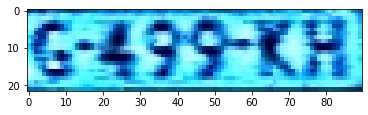

Plates found: ['C-Z922-LH', '6-429-KH', 'G-472-KH', 'G-Z72-KH', '6-222-XH', '6-829-XH', 'G-L22-KH', 'G-292-KA', 'G-829-XH']
G-499-KH
Max accuracy: 0.6666666666666666
Speed: 4.829

../Dataset/TesseractEvaluation/evaluation/model_1/027.jpg


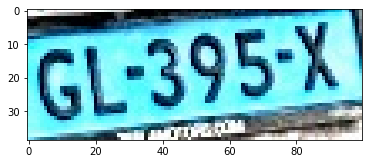

Plates found: ['GL395-L', 'GL395X', 'GL395L', 'GL-395L', 'GL-395-L']
GL-395-X
Max accuracy: 1.0
Speed: 5.066

../Dataset/TesseractEvaluation/evaluation/model_1/028.jpg


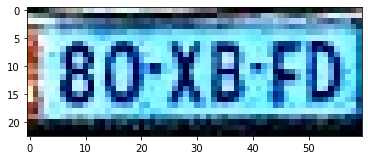

Plates found: ['I-8T-XB-FD', 'I80-XB-FDJ', 'F8D-XB-FD', '80-XB-F2', '80-XB-FD', 'I80-XB-FD']
80-XB-FD
Max accuracy: 1.0
Speed: 4.484

../Dataset/TesseractEvaluation/evaluation/model_1/029.jpg


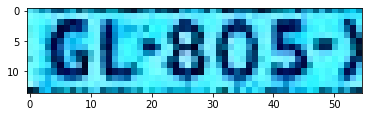

Plates found: ['BE-905-J', 'GL-805-J', 'BE-305-J', 'GL-905-J', '5L-805-J']
GL-805-X
Max accuracy: 0.8333333333333334
Speed: 4.344

../Dataset/TesseractEvaluation/evaluation/model_1/030.jpg


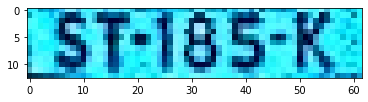

Plates found: ['ST-185-K', 'ST183-K3', 'ST-185-K3', 'ST-J85-K', 'ST183-K', 'ST-1B3-K']
ST-185-K
Max accuracy: 1.0
Speed: 4.531

../Dataset/TesseractEvaluation/evaluation/model_1/031.jpg


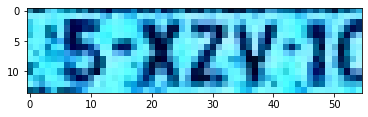

Plates found: ['75-XZY-JC', '3B-XZY-IC', 'B-XZY-3L', '2E5-XZV-IC', '75-XZY-IJL', '75-XZV-IC', 'HB-XZV-3Z', 'E-XZY-IL']
5-XZV-10
Max accuracy: 0.6153846153846154
Speed: 4.325

../Dataset/TesseractEvaluation/evaluation/model_1/033.jpg


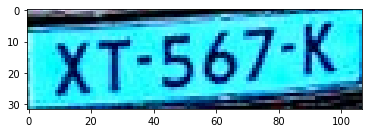

Plates found: ['XT-567-K', 'XT-567-L']
XT-567-K
Max accuracy: 1.0
Speed: 4.909

../Dataset/TesseractEvaluation/evaluation/model_1/034.jpg


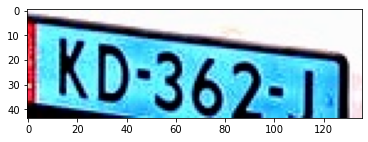

Plates found: ['KD-357-T', 'IKD-357-TI', 'IKD-367-TI', 'KD-357-TI', 'IKD367-T']
KD-362-J
Max accuracy: 0.6153846153846154
Speed: 5.331

../Dataset/TesseractEvaluation/evaluation/model_1/035.jpg


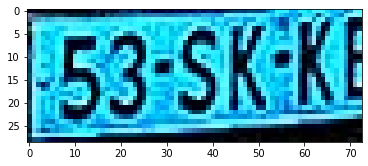

Plates found: ['53-SK-KS', '53-SKKE', '53-SKK1', '53-SKKI']
53-SK-KB
Max accuracy: 0.8333333333333334
Speed: 4.637

../Dataset/TesseractEvaluation/evaluation/model_1/036.jpg


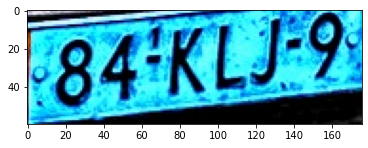

Plates found: ['85KLZZ', '84KLZZ', '84KLJZ']
84-KLJ-9
Max accuracy: 0.8333333333333334
Speed: 6.607

../Dataset/TesseractEvaluation/evaluation/model_1/038.jpg


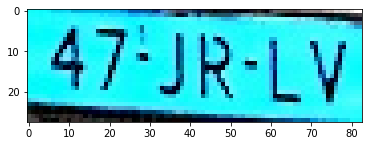

Plates found: ['47-JR-LV']
47-JR-LV
Max accuracy: 1.0
Speed: 4.42

../Dataset/TesseractEvaluation/evaluation/model_1/039.jpg


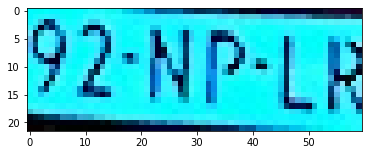

Plates found: ['72-NP-LK', '72-HD-LR', '92-NP-LR', '92-NP-LK', '72-NP-LR']
92-NP-LR
Max accuracy: 1.0
Speed: 4.248

../Dataset/TesseractEvaluation/evaluation/model_1/042.jpg


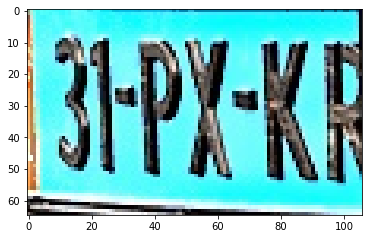

Plates found: ['3IPJ-HI', '3IPJ-KI', '3IP1-KI', '3IPJ-KF', '3IP1-HI']
31-PX-KR
Max accuracy: 0.5
Speed: 5.287

../Dataset/TesseractEvaluation/evaluation/model_1/043.jpg


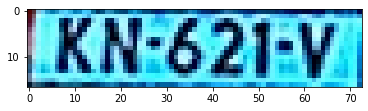

Plates found: ['KH-621V', 'KN-621-V', 'KN-6Z1-V', 'KN-6Z21V', 'KN-621V-I', 'KN-521V']
KN-621-V
Max accuracy: 1.0
Speed: 4.508

../Dataset/TesseractEvaluation/evaluation/model_1/044.jpg


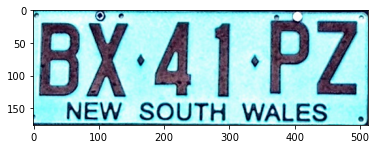

Plates found: ['BX-41-PZ', 'BX-4-1-PZ']
BX-41-PZ
Max accuracy: 1.0
Speed: 16.962

../Dataset/TesseractEvaluation/evaluation/model_1/045.jpg


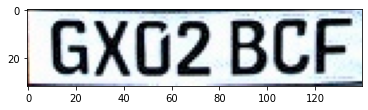

Plates found: ['GX02-BCF', 'GXD2-BCF', 'GX0U2-BCF', 'GX0Z2-BCF']
GX02 BCF
Max accuracy: 1.0
Speed: 5.156

../Dataset/TesseractEvaluation/evaluation/model_1/046.jpg


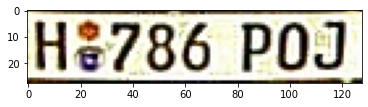

Plates found: ['H8786-P0J', 'H2786-P0J']
H 786 POJ
Max accuracy: 0.8
Speed: 5.135

Average time: 5.737718749999999
Average accuracy: 0.7396863553113553


In [56]:
Tesseract_Complete_Evaluation(r"model_1/", lang="plate_model_4")

# Mask R-CNN model 2

In [62]:
plates = [
         ["56-TK-JL"], ["PJ-034-T"], ["07-NJB-5"],
         ["17-HK-LG"], ["J-179-RT"], ["9-XHP-78"],
         ["76-XJ-XP"], ["TX-979-F"], ["24-XV-LZ"],
         ["TX-882-S"], ["92-RZ-XZ"], ["98-ST-XX"], ["29-JTF-7"],
         ["8-ZKX-27"], ["85-NB-XG"],
         ["64-PH-TH"], ["29-LJK-3"],
         ["G-499-KH"], ["KF-544-F"],
         ["56-ZF-DL"], ["G-499-KH"],
         ["GL-395-X"], ["80-XB-FD"], ["ST-185-K"], ["GL-805-X"],
         ["XT-567-K"],
         ["KD-362-J"],
         ["84-KLJ-9"], ["53-SK-KB"], ["KL-923-F"], ["55-NZ-TV"], ["47-JR-LV"], ["92-NP-LR"], ["31-PX-KR"],
         ["KN-621-V"], ["BX-41-PZ"], ["GX02 BCF"], ["H 786 POJ"]
]
print(len(plates))

38


../Dataset/MaskRCNNEvaluation/001.jpg


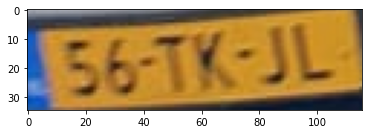

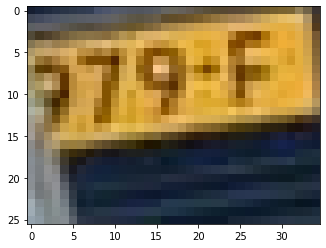

../Dataset/MaskRCNNEvaluation/002.jpg


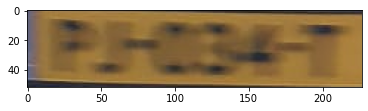

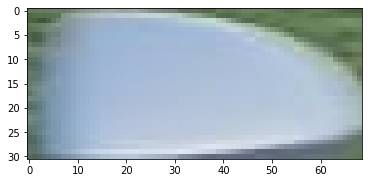

../Dataset/MaskRCNNEvaluation/003.jpg


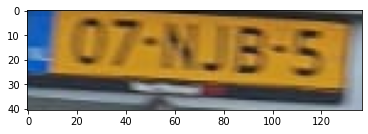

../Dataset/MaskRCNNEvaluation/004.jpg


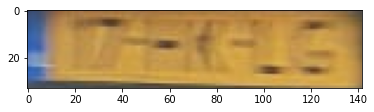

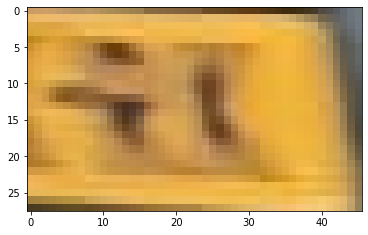

../Dataset/MaskRCNNEvaluation/005.jpg


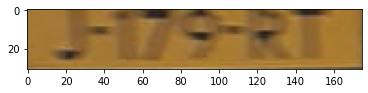

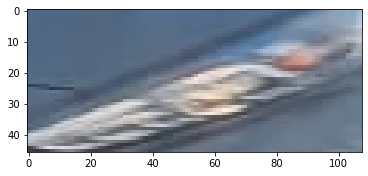

../Dataset/MaskRCNNEvaluation/006.jpg


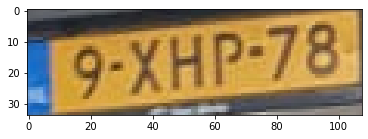

../Dataset/MaskRCNNEvaluation/007.jpg


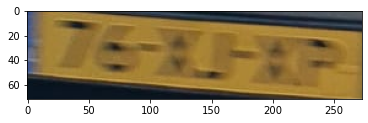

../Dataset/MaskRCNNEvaluation/008.jpg


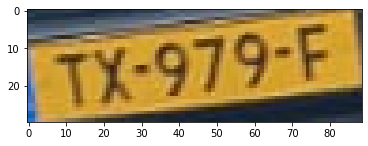

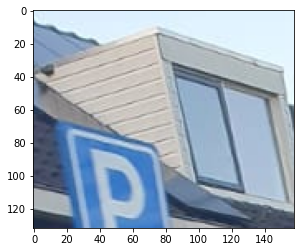

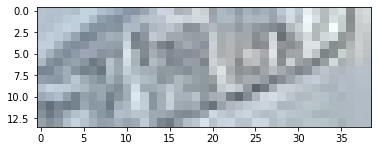

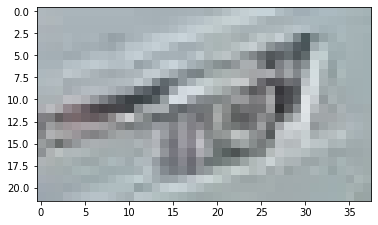

../Dataset/MaskRCNNEvaluation/009.jpg


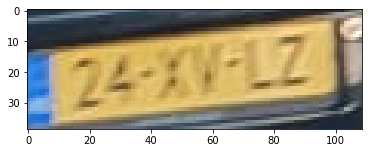

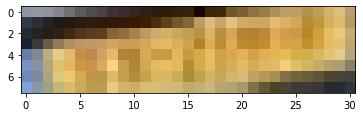

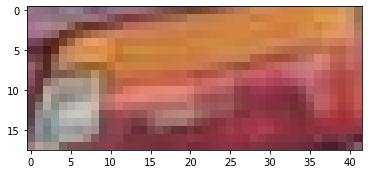

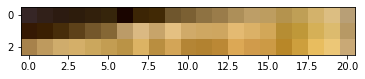

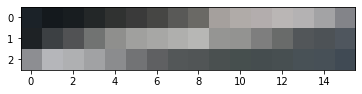

../Dataset/MaskRCNNEvaluation/010.jpg


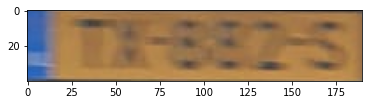

../Dataset/MaskRCNNEvaluation/011.jpg


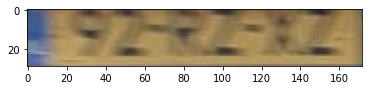

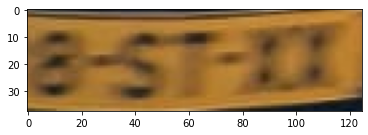

../Dataset/MaskRCNNEvaluation/012.jpg


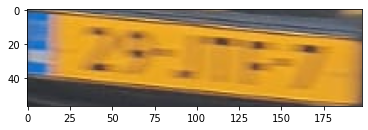

../Dataset/MaskRCNNEvaluation/013.jpg


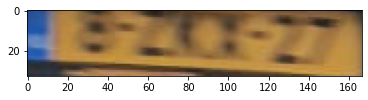

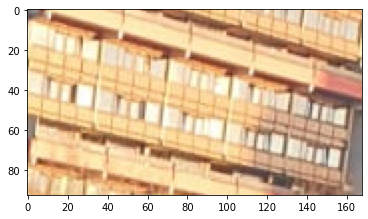

../Dataset/MaskRCNNEvaluation/014.jpg


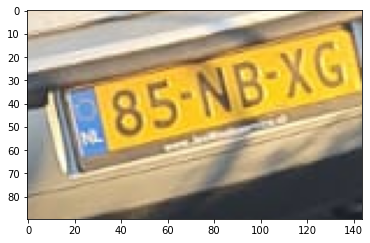

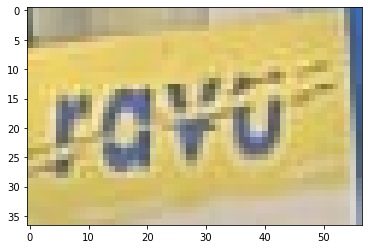

../Dataset/MaskRCNNEvaluation/015.jpg


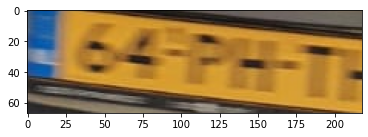

../Dataset/MaskRCNNEvaluation/016.jpg


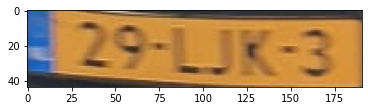

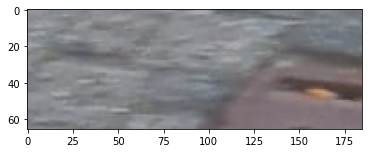

../Dataset/MaskRCNNEvaluation/017.jpg


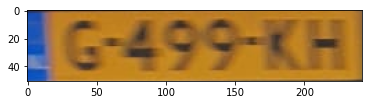

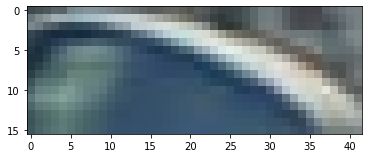

../Dataset/MaskRCNNEvaluation/018.jpg


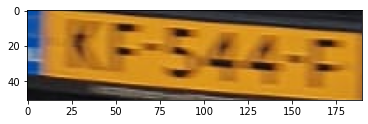

../Dataset/MaskRCNNEvaluation/019.jpg
../Dataset/MaskRCNNEvaluation/020.jpg


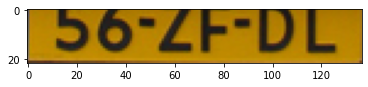

../Dataset/MaskRCNNEvaluation/021.JPG


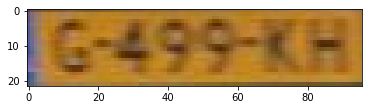

../Dataset/MaskRCNNEvaluation/022.jpg


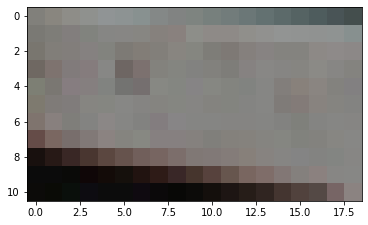

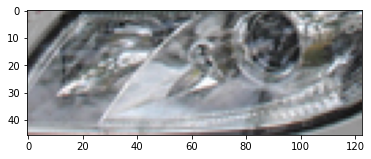

../Dataset/MaskRCNNEvaluation/023.jpg


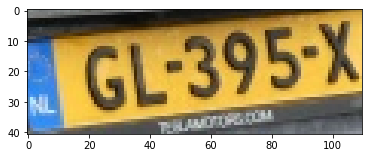

../Dataset/MaskRCNNEvaluation/024.jpg


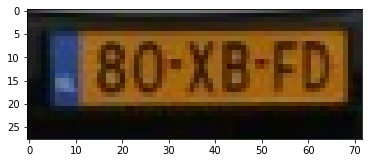

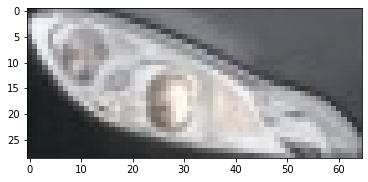

../Dataset/MaskRCNNEvaluation/025.jpg


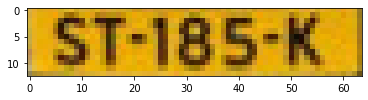

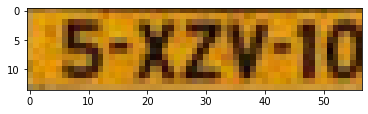

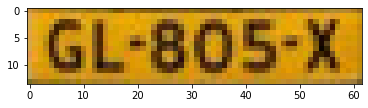

../Dataset/MaskRCNNEvaluation/026.JPG


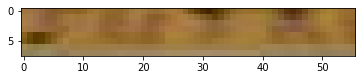

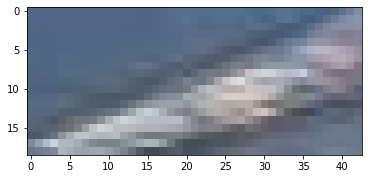

../Dataset/MaskRCNNEvaluation/027.jpg


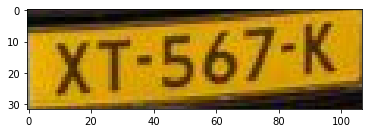

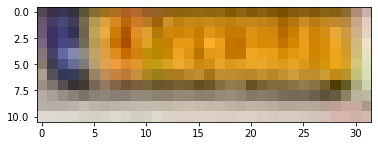

../Dataset/MaskRCNNEvaluation/028.jpg


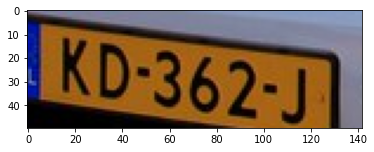

../Dataset/MaskRCNNEvaluation/029.jpg


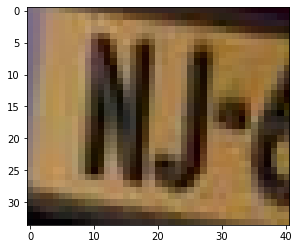

../Dataset/MaskRCNNEvaluation/030.jpg


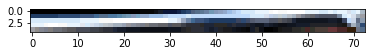

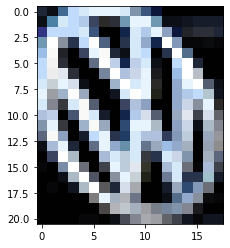

../Dataset/MaskRCNNEvaluation/031.jpg


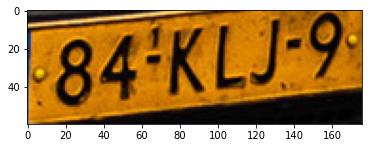

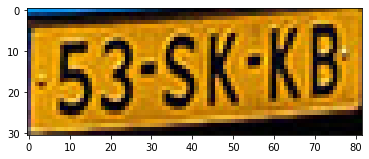

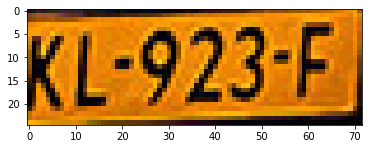

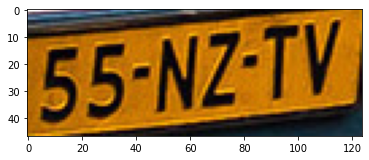

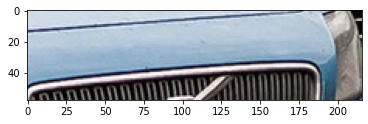

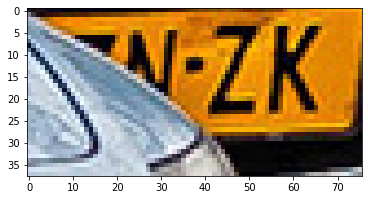

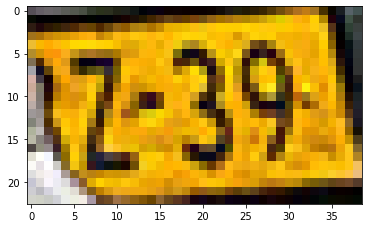

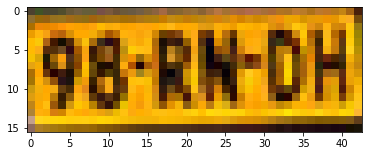

../Dataset/MaskRCNNEvaluation/032.jpg


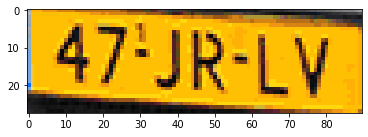

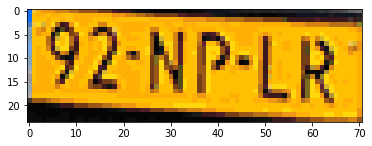

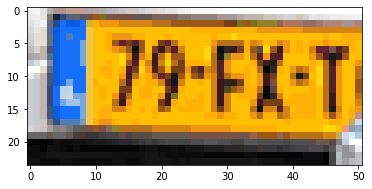

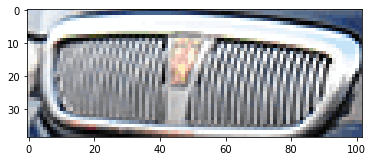

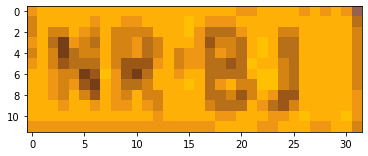

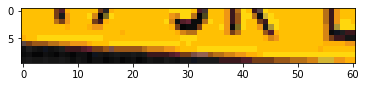

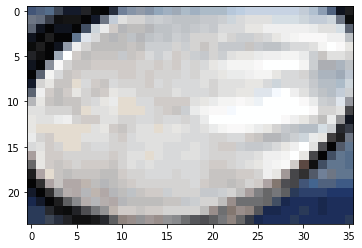

../Dataset/MaskRCNNEvaluation/033.jpg


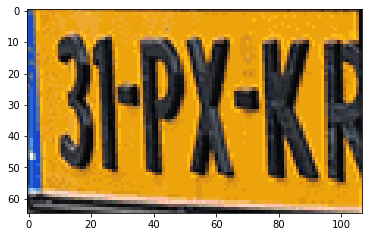

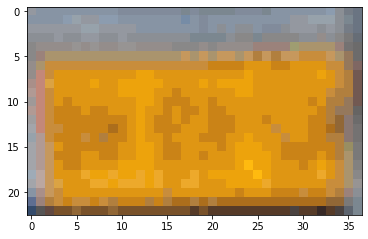

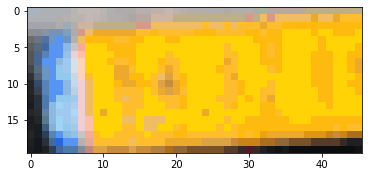

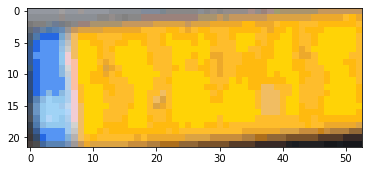

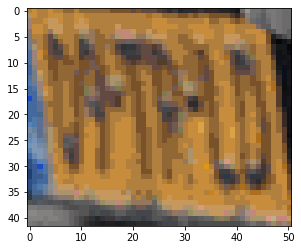

../Dataset/MaskRCNNEvaluation/034.jpg


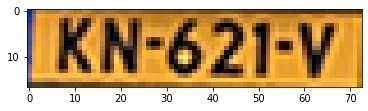

../Dataset/MaskRCNNEvaluation/035.jpg


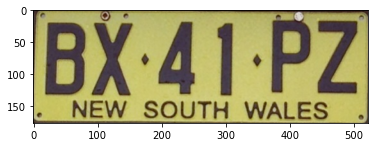

../Dataset/MaskRCNNEvaluation/036.jpg


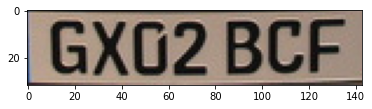

../Dataset/MaskRCNNEvaluation/037.jpg


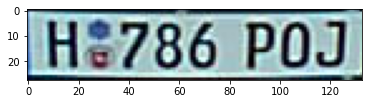

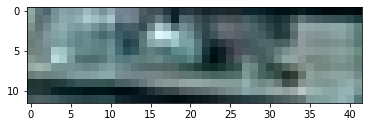

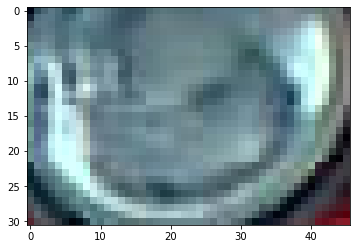

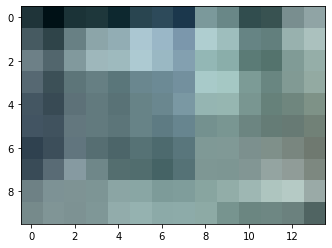

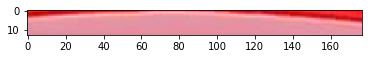

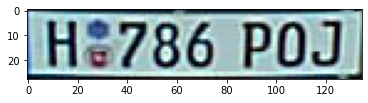

7.561583634969351

In [60]:
Detect_Plates_In_Folder(model_vers2)

../Dataset/TesseractEvaluation/evaluation/model_2/000.jpg


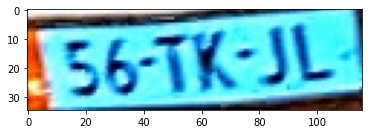

Plates found: ['LC5-TK-3L', 'LS6TK-3L', 'FC5-TK-3L', 'FZ6-TK-3L', 'F565-TK-3L', 'LS6-TK-3L', 'FC65-TK-3L']
56-TK-JL
Max accuracy: 0.7142857142857143
Speed: 7.471

../Dataset/TesseractEvaluation/evaluation/model_2/002.jpg


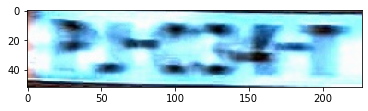

Plates found: ['BS-ZSE-T', 'B-S-Z3E-T', 'BDS-C3E-T', 'PS-ZSE-T']
PJ-034-T
Max accuracy: 0.3333333333333333
Speed: 6.771

../Dataset/TesseractEvaluation/evaluation/model_2/004.jpg


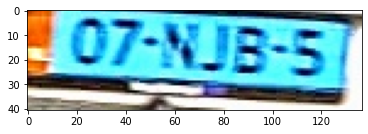

Plates found: ['LOZ-NJB-5', 'LCZ-N23-3T', '07-KJB-5T', 'LOZ-NJZ-5', 'LZZ-N25-S', 'L0Z-NJB-ST', 'CCZ-N2Z-3', 'LCZ-N25-3', '07-RJB-5T', 'L0Z-NJB-5T']
07-NJB-5
Max accuracy: 0.7692307692307693
Speed: 5.742

../Dataset/TesseractEvaluation/evaluation/model_2/005.jpg


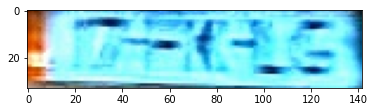

Plates found: ['E-T-1-1-Z1', 'E-T-1-L-Z1', '7-77-X-LC9', 'J-T77TX-2ZY']
17-HK-LG
Max accuracy: 0.3333333333333333
Speed: 5.278

../Dataset/TesseractEvaluation/evaluation/model_2/007.jpg


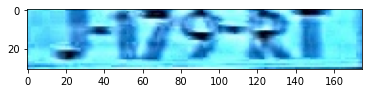

Plates found: ['E3-3F9-Z1', '3-3F9-Z1', '43-3F9-Z1', 'I8-2F3-E8', '8E7-2-85', 'F1IF9-Z1', '3-IF9-21', 'X3-373-Z1', '3-IF9-R1', 'F1F2-X1']
J-179-RT
Max accuracy: 0.3333333333333333
Speed: 5.502

../Dataset/TesseractEvaluation/evaluation/model_2/009.jpg


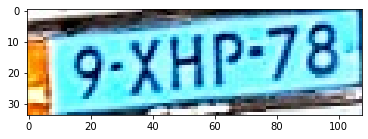

Plates found: ['F9-XHP-Z8', 'F9-XHP-78', 'F9-XHDP-78']
9-XHP-78
Max accuracy: 0.9230769230769231
Speed: 4.946

../Dataset/TesseractEvaluation/evaluation/model_2/010.jpg


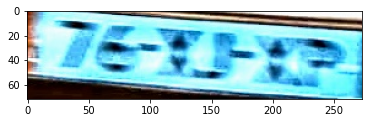

Plates found: ['L-Z-TF-TS', 'LE-TS-TS', '7E-T5-C2', 'LS-YT-1T', '7E-T5-C3']
76-XJ-XP
Max accuracy: 0.16666666666666666
Speed: 7.583

../Dataset/TesseractEvaluation/evaluation/model_2/011.jpg


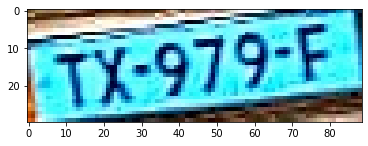

Plates found: ['TY973E', 'TX972EZ', 'TY-972-E', 'TX972E', 'TX-972-Z', 'TY-979-E', 'TY972E', 'TX-973-E']
TX-979-F
Max accuracy: 0.6666666666666666
Speed: 4.93

../Dataset/TesseractEvaluation/evaluation/model_2/015.jpg


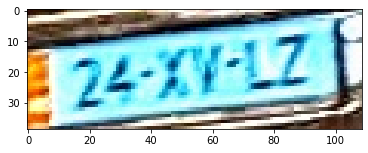

Plates found: ['F7Z-7-ZJ', 'F2Z-71-LZ-L', 'F7Z-7L-ZJ', 'F7Z-77-LZ-J', 'F7Z-71-ZJ', 'F7Z-77-Z-J']
24-XV-LZ
Max accuracy: 0.42857142857142855
Speed: 5.031

../Dataset/TesseractEvaluation/evaluation/model_2/020.jpg


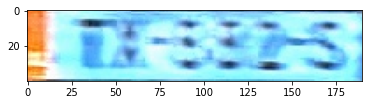

Plates found: ['8-TZ-CZZ-S5J', 'LEJ-3E-S', 'TE-S322-5', 'L-TT-CX2', '8-T2-ZZZ-S', '1-T3-ZZZ-S', '1-ZZ-CZ2-5J', '1-TZ-ZZZ-S']
TX-882-S
Max accuracy: 0.5
Speed: 5.636

../Dataset/TesseractEvaluation/evaluation/model_2/021.jpg


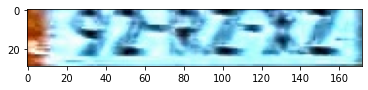

Plates found: ['E-9Z-SZ-ZZ', 'E-7Z-ZEZ-ZZ', 'E-9Z-KZ-ZZ-I', '8-9Z-KZ-ZZ-I', '8-9Z-CZ-X-Z', 'R-2Z-CZ-Z-Z', 'E-9Z-SZ-XZ', 'E-9Z-XZ-XZ', '8-9Z-KZ-ZZ-1', '9Z-XE-ZZ']
92-RZ-XZ
Max accuracy: 0.6666666666666666
Speed: 5.513

../Dataset/TesseractEvaluation/evaluation/model_2/022.jpg


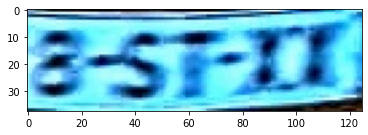

Plates found: ['8-ST-ZZJ', '8-ST-ZXJ', '8-5TF-EXJ', '3S-ST-ZX']
98-ST-XX
Max accuracy: 0.6666666666666666
Speed: 5.71

../Dataset/TesseractEvaluation/evaluation/model_2/023.jpg


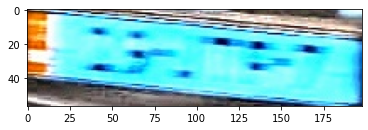

Plates found: []
29-JTF-7
../Dataset/TesseractEvaluation/evaluation/model_2/024.jpg


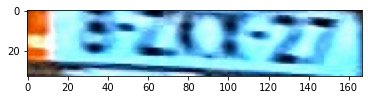

Plates found: ['L-Z-6CY-ZT', '5-S-LX-Z7', 'L-Z-4CT-ZT', 'L-Z-4CX-Z7', 'L-S-8Y-ZT', '3-Z-4CX-Z7', 'L-S-4LX-Z7', '8-S-LCX-Z7', 'L-Z-CY-ZT']
8-ZKX-27
Max accuracy: 0.46153846153846156
Speed: 5.669

../Dataset/TesseractEvaluation/evaluation/model_2/026.jpg


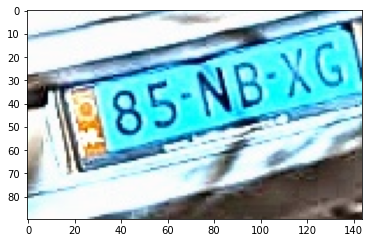

Plates found: []
85-NB-XG
../Dataset/TesseractEvaluation/evaluation/model_2/028.jpg


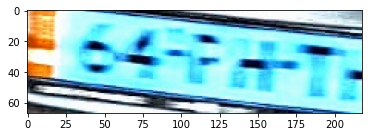

Plates found: ['E-SX-T-TT', 'E-S2-T-ZT', 'E-SS-TJ-T', 'E-CS-T7T']
64-PH-TH
Max accuracy: 0.16666666666666666
Speed: 6.76

../Dataset/TesseractEvaluation/evaluation/model_2/029.jpg


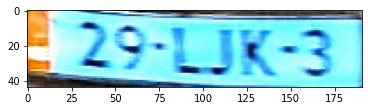

Plates found: ['Z-23S-1-JX-2', '2S-L-1C-T', 'S-29-L-IK-3', 'S-29-L-JK-3', 'Z-2S5-1-JK-3', 'Z-2S-1-JK-3', 'Z-2S-1-JX-3', 'S-2S-1-JK-3']
29-LJK-3
Max accuracy: 0.9230769230769231
Speed: 6.128

../Dataset/TesseractEvaluation/evaluation/model_2/031.jpg


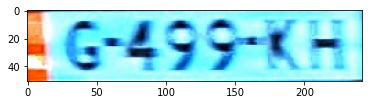

Plates found: ['LG-499-KH', 'L-C-477-C', 'LG-9G7-K', 'LG-499-K5', 'LG-45G-X', 'LG-477-X', 'LG-499-K', 'L-GC-477-L', 'XG-499-KH', 'NG-Z499-KH']
G-499-KH
Max accuracy: 0.9230769230769231
Speed: 6.75

../Dataset/TesseractEvaluation/evaluation/model_2/033.jpg


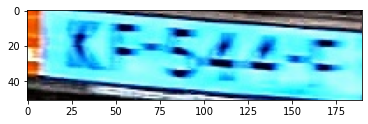

Plates found: ['LLT-5ZZ-C', 'LL-S2Z-C', 'LLZ-S22-C', 'L8-C-Z42-C', 'LC-S2Z-C', 'LS-C-Z22-C', 'LS-C-Z42-C']
KF-544-F
Max accuracy: 0.15384615384615385
Speed: 5.852

../Dataset/TesseractEvaluation/evaluation/model_2/034.jpg


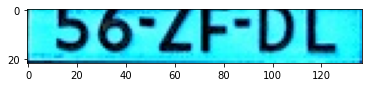

Plates found: ['9O7ZF-UL', '9O-ZF-UL', '9Q-ZF-U-L', '9O-ZF-U-L', '9O-ZF-UDL']
56-ZF-DL
Max accuracy: 0.6153846153846154
Speed: 5.275

../Dataset/TesseractEvaluation/evaluation/model_2/035.jpg


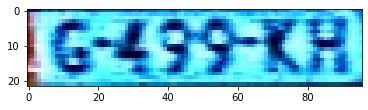

Plates found: ['1G-Z922-KH', 'G-Z79-LH', 'G-479-KH', 'G4922-EH', '1G4992-KH', 'G-ZZ9-LH']
G-499-KH
Max accuracy: 0.8571428571428571
Speed: 4.956

../Dataset/TesseractEvaluation/evaluation/model_2/038.jpg


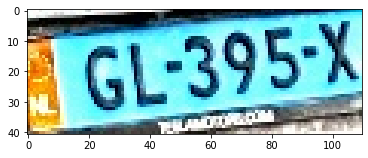

Plates found: ['Z-GL-395X', 'N-GL-37-Z2', 'LGL-393X', 'L-GL-37-2Z', 'ZGL-393X', 'FGL-393X']
GL-395-X
Max accuracy: 0.9230769230769231
Speed: 5.351

../Dataset/TesseractEvaluation/evaluation/model_2/039.jpg


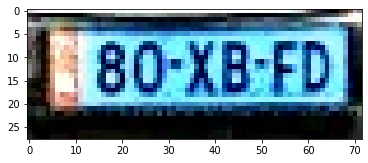

Plates found: ['E-80-XB-FD1', 'E-80-XB-FD', 'E-80-XB-IDJ', 'L-30XE-F0', 'E-80-XE-FD1', 'ETG0-XB-TD1']
80-XB-FD
Max accuracy: 0.9230769230769231
Speed: 4.829

../Dataset/TesseractEvaluation/evaluation/model_2/041.jpg


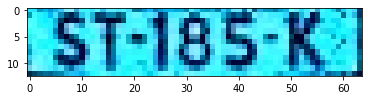

Plates found: ['STJB3-K', 'ST-185-K-J', 'ST-1B3-K-I', 'ST-125-K-J', 'ST-1B3-K', 'ST-1B5-K-J']
ST-185-K
Max accuracy: 0.9230769230769231
Speed: 4.66

../Dataset/TesseractEvaluation/evaluation/model_2/043.jpg


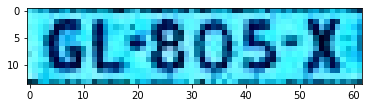

Plates found: ['G8L805-XI', 'B8L-805-X', '8L-805-X4', 'BLB05-X4', 'GL-805-X1', 'BL805-X4', 'GL-805-XI']
GL-805-X
Max accuracy: 0.9230769230769231
Speed: 4.91

../Dataset/TesseractEvaluation/evaluation/model_2/046.jpg


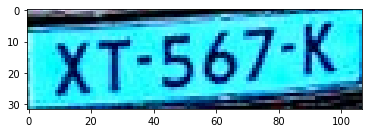

Plates found: ['XT-567-K', 'XT-567-L']
XT-567-K
Max accuracy: 1.0
Speed: 5.07

../Dataset/TesseractEvaluation/evaluation/model_2/048.jpg


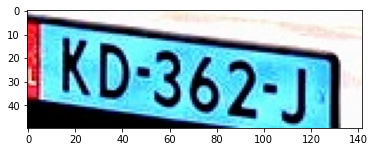

Plates found: ['KD-357-71', 'KD-36271', 'KD-35Z-71', 'KD-357-J1', 'KD-35271']
KD-362-J
Max accuracy: 0.7692307692307693
Speed: 5.804

../Dataset/TesseractEvaluation/evaluation/model_2/052.jpg


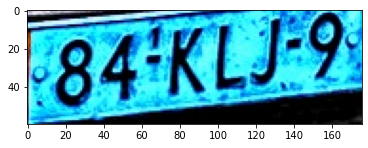

Plates found: ['85KLZZ', '84KLZZ', '84KLJZ']
84-KLJ-9
Max accuracy: 0.8333333333333334
Speed: 6.857

../Dataset/TesseractEvaluation/evaluation/model_2/053.jpg


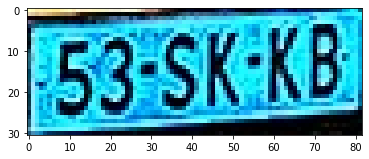

Plates found: ['53-SKK5', '53-SKKB', '53-SKK8', '53-SKK3']
53-SK-KB
Max accuracy: 1.0
Speed: 5.229

../Dataset/TesseractEvaluation/evaluation/model_2/054.jpg


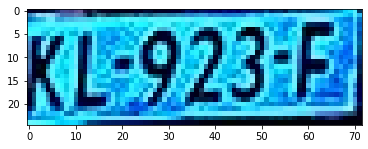

Plates found: ['KL-923-E', 'CE9232E', 'KL-9232E', 'KL-923-F', 'KL923-E']
KL-923-F
Max accuracy: 1.0
Speed: 4.608

../Dataset/TesseractEvaluation/evaluation/model_2/055.jpg


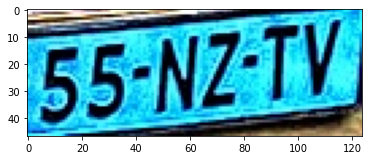

Plates found: ['55-NZ1V', '55-NZTV', '55-NZ-IV', '55-NZTL', '55-NZTU']
55-NZ-TV
Max accuracy: 1.0
Speed: 5.429

../Dataset/TesseractEvaluation/evaluation/model_2/060.jpg


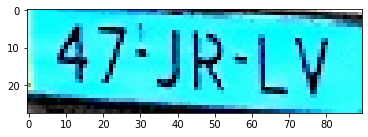

Plates found: ['47-JR-LV']
47-JR-LV
Max accuracy: 1.0
Speed: 4.665

../Dataset/TesseractEvaluation/evaluation/model_2/061.jpg


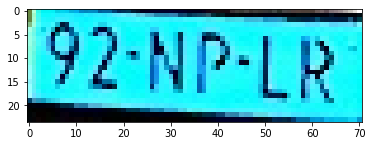

Plates found: ['92-NP-LR']
92-NP-LR
Max accuracy: 1.0
Speed: 4.479

../Dataset/TesseractEvaluation/evaluation/model_2/067.jpg


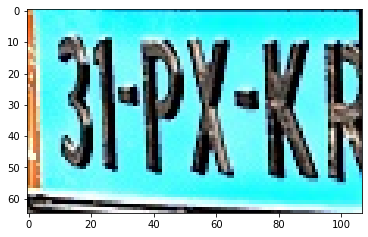

Plates found: ['3IP1HI', '3IPI-KF', '3IPIKF', '3IP1-KF', '3IP1-HI']
31-PX-KR
Max accuracy: 0.5
Speed: 5.935

../Dataset/TesseractEvaluation/evaluation/model_2/072.jpg


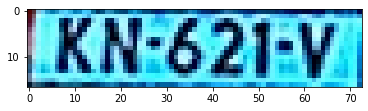

Plates found: ['KH-621V', 'KN-621-V', 'KN-6Z1-V', 'KN-6Z21V', 'KN-621V-I', 'KN-521V']
KN-621-V
Max accuracy: 1.0
Speed: 4.944

../Dataset/TesseractEvaluation/evaluation/model_2/073.jpg


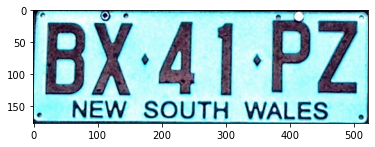

Plates found: ['BX-41-PZ', 'BX-4-1-PZ']
BX-41-PZ
Max accuracy: 1.0
Speed: 17.92

../Dataset/TesseractEvaluation/evaluation/model_2/074.jpg


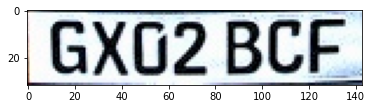

Plates found: ['GX02-BCF', 'GX0U2-BCF', 'GX0Z2-BCF']
GX02 BCF
Max accuracy: 1.0
Speed: 5.313

../Dataset/TesseractEvaluation/evaluation/model_2/075.jpg


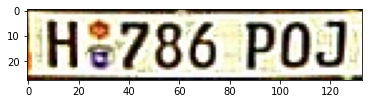

Plates found: ['H8786-P07', 'HS786-P0J', 'H8786-P0J', 'IH8786-PDJ', 'H3786-PDJ', 'H3786-P0J', 'IH8786-P0J']
H 786 POJ
Max accuracy: 0.8
Speed: 5.181

Average time: 5.970078947368422
Average accuracy: 0.7277065527065527


In [63]:
Tesseract_Complete_Evaluation(r"model_2/")

# Mask RCNN Model 3

In [12]:
plates = [
         ["56-TK-JL"], ["PJ-034-T"], ["07-NJB-5"],
         ["17-HK-LG"], ["9-XHP-78"],
         ["76-XJ-XP"], ["TX-979-F"], ["24-XV-LZ"],
         ["TX-882-S"], ["98-ST-XX"], ["92-RZ-XZ"], ["8-ZKX-27"], ["85-NB-XG"],
         ["64-PH-T"], ["29-LJK-3"],
         ["G-499-KH"], ["KF-544-F"], ["56-ZF-DL"], ["G-499-KH"],
         ["GL-395-X"], ["5-XZY-10"],
         ["ST-185-K"], ["GL-805-X"], ["XT-567-K"], ["KD-362-J"],
         ["84-KLJ-9"], ["KL-923-F"], ["53-SK-KB"], ["55-NZ-TV"], ["92-NP-LR"],
         ["47-JR-LV"], ["31-PX-KR"],
         ["KN-621-V"], ["BX-41-PZ"],
         ["GX02 BCF"], ["H 786 POJ"]
]
print(len(plates))

36


../Dataset/MaskRCNNEvaluation/001.jpg


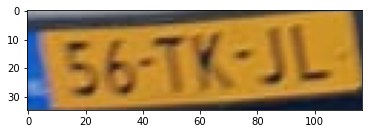

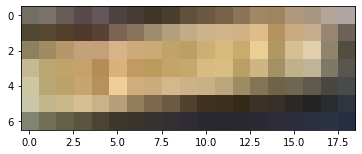

../Dataset/MaskRCNNEvaluation/002.jpg


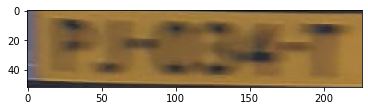

../Dataset/MaskRCNNEvaluation/003.jpg


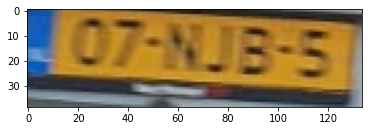

../Dataset/MaskRCNNEvaluation/004.jpg


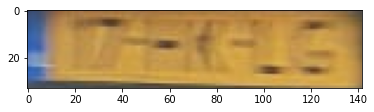

../Dataset/MaskRCNNEvaluation/005.jpg
../Dataset/MaskRCNNEvaluation/006.jpg


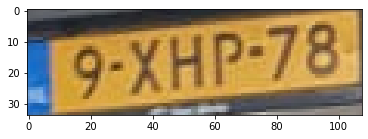

../Dataset/MaskRCNNEvaluation/007.jpg


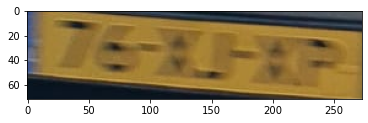

../Dataset/MaskRCNNEvaluation/008.jpg


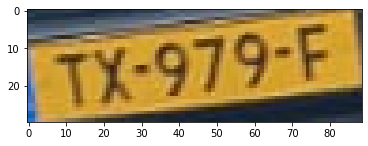

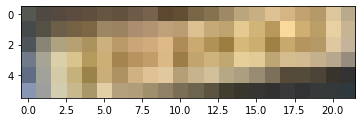

../Dataset/MaskRCNNEvaluation/009.jpg


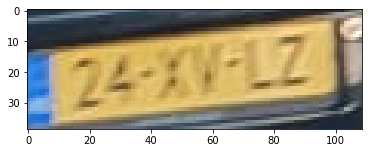

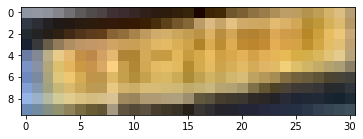

../Dataset/MaskRCNNEvaluation/010.jpg


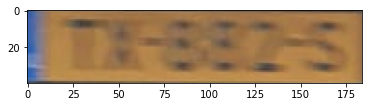

../Dataset/MaskRCNNEvaluation/011.jpg


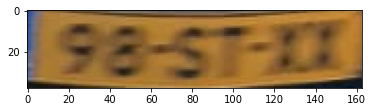

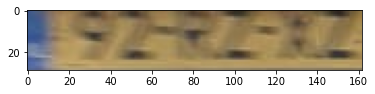

../Dataset/MaskRCNNEvaluation/012.jpg
../Dataset/MaskRCNNEvaluation/013.jpg


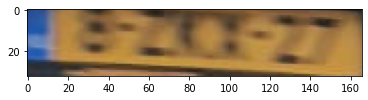

../Dataset/MaskRCNNEvaluation/014.jpg


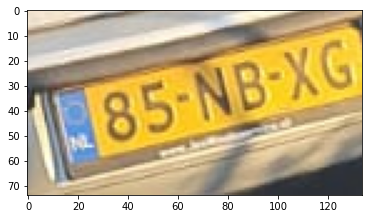

../Dataset/MaskRCNNEvaluation/015.jpg


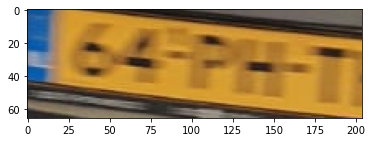

../Dataset/MaskRCNNEvaluation/016.jpg


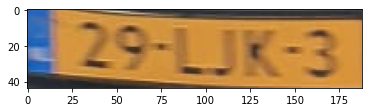

../Dataset/MaskRCNNEvaluation/017.jpg


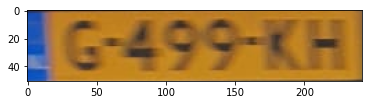

../Dataset/MaskRCNNEvaluation/018.jpg


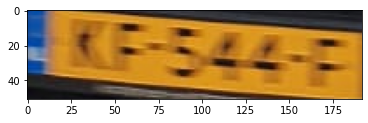

../Dataset/MaskRCNNEvaluation/019.jpg
../Dataset/MaskRCNNEvaluation/020.jpg


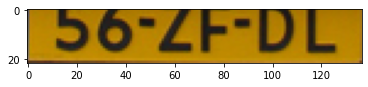

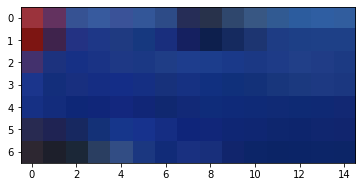

../Dataset/MaskRCNNEvaluation/021.JPG


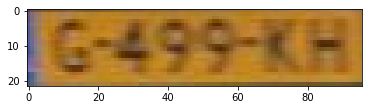

../Dataset/MaskRCNNEvaluation/022.jpg


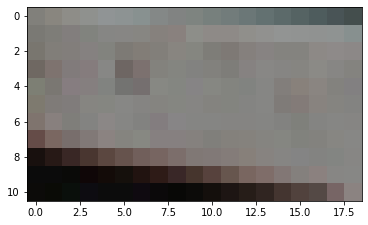

../Dataset/MaskRCNNEvaluation/023.jpg


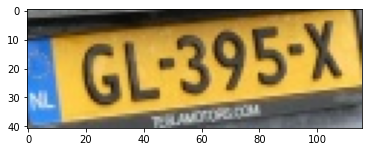

../Dataset/MaskRCNNEvaluation/024.jpg


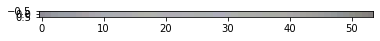

../Dataset/MaskRCNNEvaluation/025.jpg


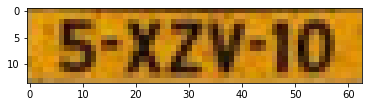

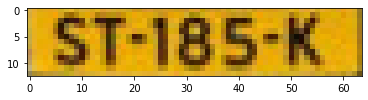

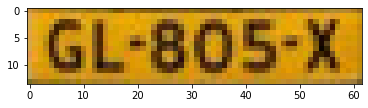

../Dataset/MaskRCNNEvaluation/026.JPG
../Dataset/MaskRCNNEvaluation/027.jpg


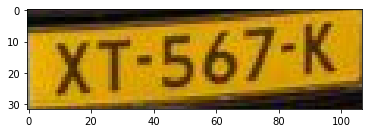

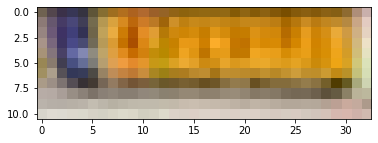

../Dataset/MaskRCNNEvaluation/028.jpg


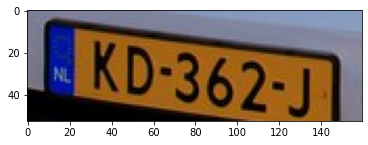

../Dataset/MaskRCNNEvaluation/029.jpg


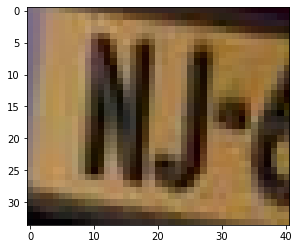

../Dataset/MaskRCNNEvaluation/030.jpg


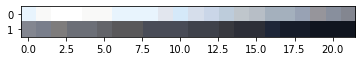

../Dataset/MaskRCNNEvaluation/031.jpg


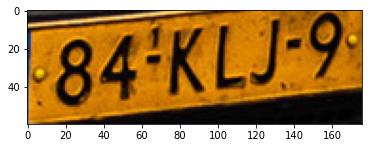

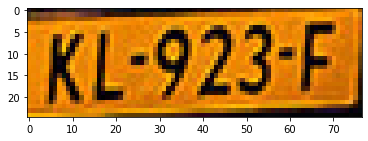

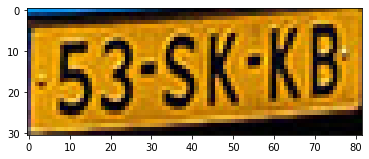

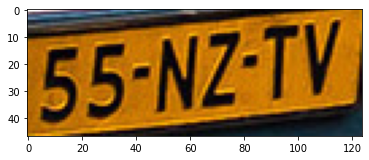

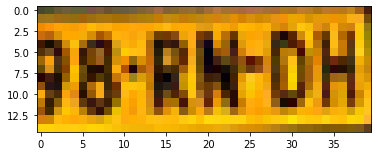

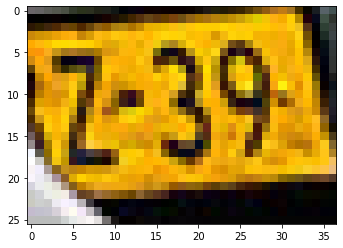

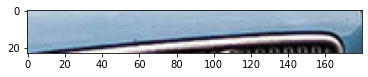

../Dataset/MaskRCNNEvaluation/032.jpg


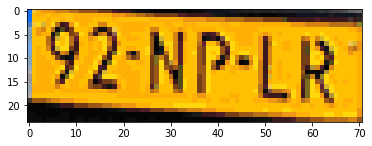

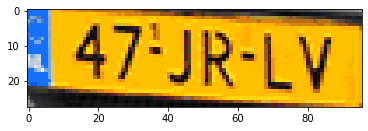

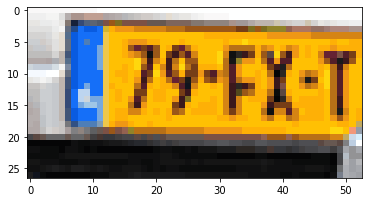

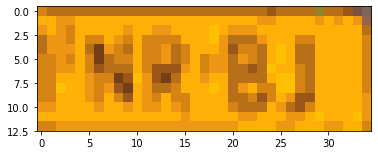

../Dataset/MaskRCNNEvaluation/033.jpg


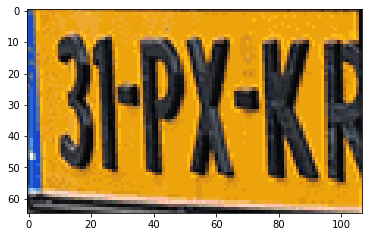

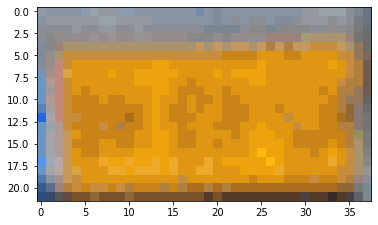

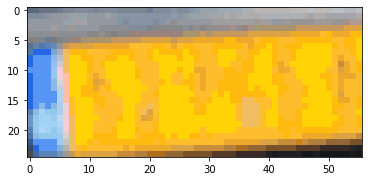

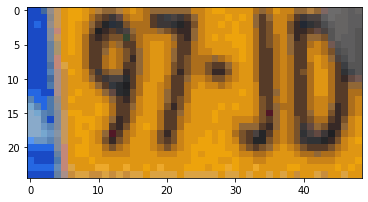

../Dataset/MaskRCNNEvaluation/034.jpg


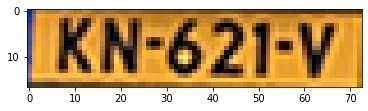

../Dataset/MaskRCNNEvaluation/035.jpg


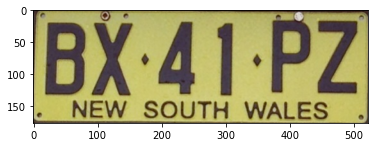

../Dataset/MaskRCNNEvaluation/036.jpg


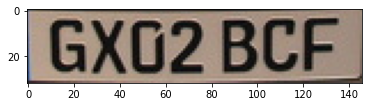

../Dataset/MaskRCNNEvaluation/037.jpg


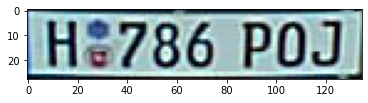

6.9193730612058895

In [64]:
Detect_Plates_In_Folder(model_vers3)

../Dataset/TesseractEvaluation/evaluation/model_3/000.jpg


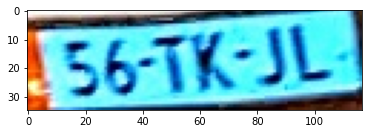

Plates found: ['LS5-TX-3L', 'LS6TK-3L', 'LS56-TK-3L', 'LZ6-TX-3L', 'FC5-TK-3L', 'LS6-TK-3L', 'F55-T4-3L', 'FC5-TH-3L']
56-TK-JL
Max accuracy: 0.7142857142857143
Speed: 5.324

../Dataset/TesseractEvaluation/evaluation/model_3/002.jpg


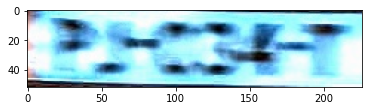

Plates found: ['BDS-CSE-T', 'B-S-Z3E-T', '2S-Z3E-T', 'PS-ZSE-T', 'PS-ZSE-T7']
PJ-034-T
Max accuracy: 0.3333333333333333
Speed: 6.208

../Dataset/TesseractEvaluation/evaluation/model_3/003.jpg


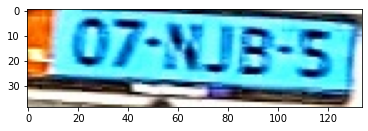

Plates found: ['L-0Z-KJB-51', 'L-O7-XJB-ST', 'S-C7-X2-5T', 'L-07-XJB-5T', 'L-07-NJB-51', 'L37-NJB-5', 'E-C7-NJZ-ST', 'R-C7-X2-5T', 'L07-XJB-51']
07-NJB-5
Max accuracy: 0.8571428571428571
Speed: 6.154

../Dataset/TesseractEvaluation/evaluation/model_3/004.jpg


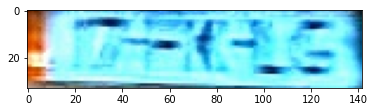

Plates found: ['E-T-1-1-Z1', 'E-T-1-L-Z1', '7-77-X-LC9', 'J-T77TX-2ZY']
17-HK-LG
Max accuracy: 0.3333333333333333
Speed: 5.452

../Dataset/TesseractEvaluation/evaluation/model_3/005.jpg


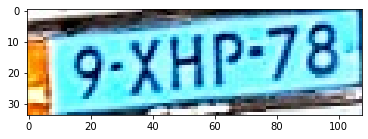

Plates found: ['F9-XHP-Z8', 'F9-XHP-78', 'F9-XHDP-78']
9-XHP-78
Max accuracy: 0.9230769230769231
Speed: 6.149

../Dataset/TesseractEvaluation/evaluation/model_3/006.jpg


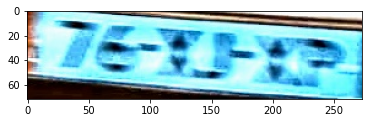

Plates found: ['L-Z-TF-TS', 'LE-TS-TS', '7E-T5-C2', 'LS-YT-1T', '7E-T5-C3']
76-XJ-XP
Max accuracy: 0.16666666666666666
Speed: 8.746

../Dataset/TesseractEvaluation/evaluation/model_3/007.jpg


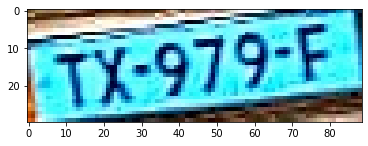

Plates found: ['TY973E', 'TX972EZ', 'TY-972-E', 'TX972E', 'TX-972-Z', 'TY-979-E', 'TY972E', 'TX-973-E']
TX-979-F
Max accuracy: 0.6666666666666666
Speed: 5.931

../Dataset/TesseractEvaluation/evaluation/model_3/009.jpg


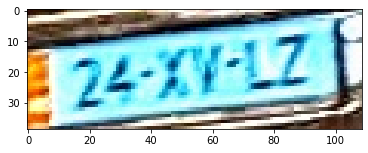

Plates found: ['F7Z-7-ZJ', 'F2Z-71-LZ-L', 'F7Z-7L-ZJ', 'F7Z-77-LZ-J', 'F7Z-71-ZJ', 'F7Z-77-Z-J']
24-XV-LZ
Max accuracy: 0.42857142857142855
Speed: 5.334

../Dataset/TesseractEvaluation/evaluation/model_3/011.jpg


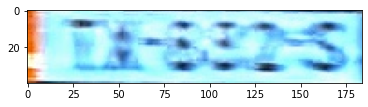

Plates found: ['V-8-22Z-S', 'F-TE-Z32-S', 'F-TE-522S', 'M-2H-IEX', 'V-TE-Z3Z2-S', '47-S-T2-Z-3', 'V-T3-22Z-S', 'V-T2-S2Z-S', 'V-TL-Z3Z-S', 'F-LE-822-S']
TX-882-S
Max accuracy: 0.5
Speed: 5.926

../Dataset/TesseractEvaluation/evaluation/model_3/012.jpg


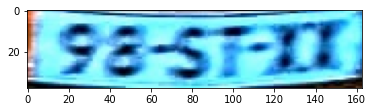

Plates found: ['SZ-ST-X1', 'L-95-ST-ZX', 'L-98-ST-ZX', 'L-S6-ST-ZX', 'L-98-ST-XX', 'S6-ST-ZL', 'SE-ST-ZL', 'SZ-ST-ZT', '98-ST-ZX', 'SE-ST-ZX']
98-ST-XX
Max accuracy: 0.9230769230769231
Speed: 6.038

../Dataset/TesseractEvaluation/evaluation/model_3/013.jpg


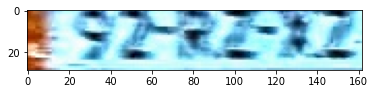

Plates found: ['E-9Z-RZ-Z-Z', '8-CZ-CCZ-8-Z', '8-7Z-XZ-8-Z', 'E-5Z-RZ-X-Z', 'SZ-BZ-ZZ', '8-7Z-SZ-Z-Z', 'E-SZ-RZ-ZZ', 'E-7Z-XZ-8-L', '8-2Z-CC-8-Z', 'E-Z-XZ-2-Z']
92-RZ-XZ
Max accuracy: 0.6153846153846154
Speed: 5.893

../Dataset/TesseractEvaluation/evaluation/model_3/014.jpg


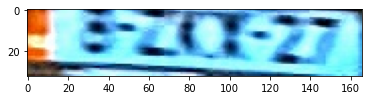

Plates found: ['L-Z-4CT-Z7', '8-C-8T-ZT', '3-S-LCX-Z7', 'L-S-8Y-ZT', 'L-S-4EX-Z7', '8-Z-CX-Z7', 'L-S-4CY-Z7', '3-Z-4CY-Z7', '5-S-LLK-Z7', 'L-Z-CY-ZT']
8-ZKX-27
Max accuracy: 0.6666666666666666
Speed: 5.704

../Dataset/TesseractEvaluation/evaluation/model_3/015.jpg


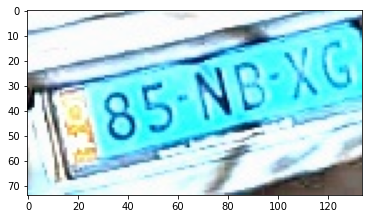

Plates found: []
85-NB-XG
../Dataset/TesseractEvaluation/evaluation/model_3/016.jpg


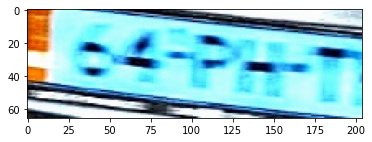

Plates found: ['E-SS-DZT']
64-PH-T
Max accuracy: 0.18181818181818182
Speed: 6.213

../Dataset/TesseractEvaluation/evaluation/model_3/017.jpg


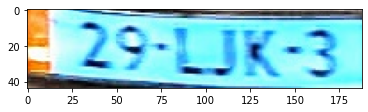

Plates found: ['Z-23-L-X-3', 'Z-2S-1-1X-3', 'Z-2S-1-1C-2', 'Z-23-1-1X-2', 'Z-29-1-JK-3', 'Z-2S5-1-1K-3', 'S-29-L-JK-3']
29-LJK-3
Max accuracy: 0.9230769230769231
Speed: 6.46

../Dataset/TesseractEvaluation/evaluation/model_3/018.jpg


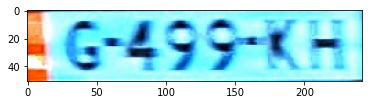

Plates found: ['LG-499-KH', 'L-C-477-C', 'LG-9G7-K', 'LG-499-K5', 'LG-45G-X', 'LG-477-X', 'LG-499-K', 'L-GC-477-L', 'XG-499-KH', 'NG-Z499-KH']
G-499-KH
Max accuracy: 0.9230769230769231
Speed: 6.591

../Dataset/TesseractEvaluation/evaluation/model_3/019.jpg


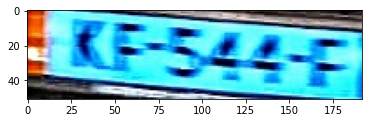

Plates found: ['L-EF-522-E', 'LCZ-S2Z-C', 'LS-C-2C-C', 'LKF-522-E', 'LKF-S5Z2-E', 'LKF-5ZZ-E', 'LCZ-S24-5', 'L-EF-52Z-E', 'LCC-Z2C-C', 'LLZ-S24-C']
KF-544-F
Max accuracy: 0.46153846153846156
Speed: 6.416

../Dataset/TesseractEvaluation/evaluation/model_3/020.jpg


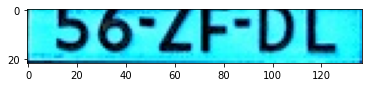

Plates found: ['9O7ZF-UL', '9O-ZF-UL', '9Q-ZF-U-L', '9O-ZF-U-L', '9O-ZF-UDL']
56-ZF-DL
Max accuracy: 0.6153846153846154
Speed: 5.244

../Dataset/TesseractEvaluation/evaluation/model_3/022.jpg


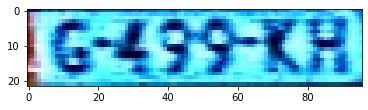

Plates found: ['1G-Z922-KH', 'G-Z79-LH', 'G-479-KH', 'G4922-EH', '1G4992-KH', 'G-ZZ9-LH']
G-499-KH
Max accuracy: 0.8571428571428571
Speed: 4.909

../Dataset/TesseractEvaluation/evaluation/model_3/024.jpg


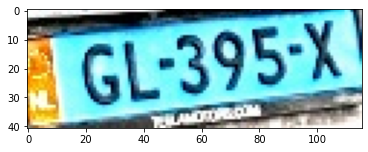

Plates found: ['F-GL-393X', 'RGL-392X', 'A-GL-37-2-L', 'TGL-393X', '7GL-392X', 'YGL-393X', 'FGL-393X', '7-GL-393X']
GL-395-X
Max accuracy: 0.7692307692307693
Speed: 5.311

../Dataset/TesseractEvaluation/evaluation/model_3/026.jpg


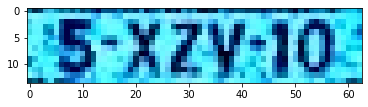

Plates found: ['B-XZY-10', '5-XZV-10', 'E-XZV-10', 'B-XZV-10', '75-XZV-10', '5-X2V-3D', 'E-XZV-I0']
5-XZY-10
Max accuracy: 0.8333333333333334
Speed: 4.88

../Dataset/TesseractEvaluation/evaluation/model_3/027.jpg


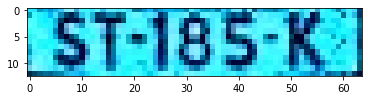

Plates found: ['STJB3-K', 'ST-185-K-J', 'ST-1B3-K-I', 'ST-125-K-J', 'ST-1B3-K', 'ST-1B5-K-J']
ST-185-K
Max accuracy: 0.9230769230769231
Speed: 4.867

../Dataset/TesseractEvaluation/evaluation/model_3/028.jpg


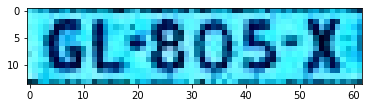

Plates found: ['G8L805-XI', 'B8L-805-X', '8L-805-X4', 'BLB05-X4', 'GL-805-X1', 'BL805-X4', 'GL-805-XI']
GL-805-X
Max accuracy: 0.9230769230769231
Speed: 4.667

../Dataset/TesseractEvaluation/evaluation/model_3/029.jpg


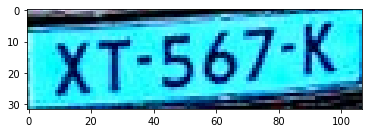

Plates found: ['XT-567-K', 'XT-567-L']
XT-567-K
Max accuracy: 1.0
Speed: 4.962

../Dataset/TesseractEvaluation/evaluation/model_3/031.jpg


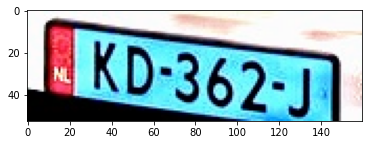

Plates found: ['EKD-3577I', 'ZKD-35771', 'EKD-35Z71', 'EKD35ZT1', 'BKD-35771', '8KD-35771', '8XD35271']
KD-362-J
Max accuracy: 0.42857142857142855
Speed: 5.76

../Dataset/TesseractEvaluation/evaluation/model_3/034.jpg


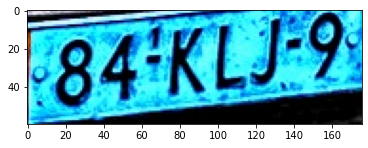

Plates found: ['85KLZZ', '84KLZZ', '84KLJZ']
84-KLJ-9
Max accuracy: 0.8333333333333334
Speed: 7.047

../Dataset/TesseractEvaluation/evaluation/model_3/035.jpg


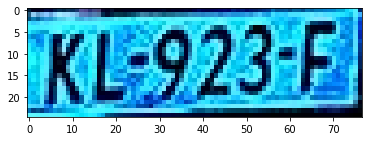

Plates found: ['KLI2923-E', 'KE925-H', 'KE-923-E', 'KI2923-E', 'KE923-E', 'KL2923-E', 'KL923-E']
KL-923-F
Max accuracy: 0.8333333333333334
Speed: 5.06

../Dataset/TesseractEvaluation/evaluation/model_3/036.jpg


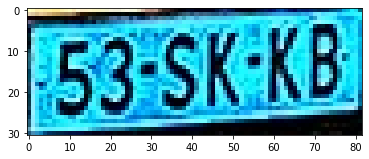

Plates found: ['53-SKK5', '53-SKKB', '53-SKK8', '53-SKK3']
53-SK-KB
Max accuracy: 1.0
Speed: 5.408

../Dataset/TesseractEvaluation/evaluation/model_3/037.jpg


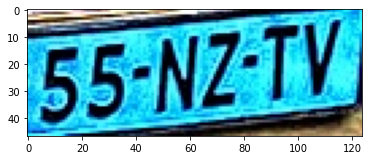

Plates found: ['55-NZ1V', '55-NZTV', '55-NZ-IV', '55-NZTL', '55-NZTU']
55-NZ-TV
Max accuracy: 1.0
Speed: 5.566

../Dataset/TesseractEvaluation/evaluation/model_3/041.jpg


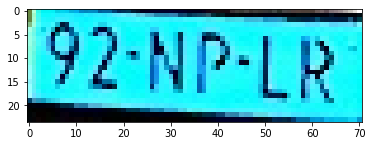

Plates found: ['92-NP-LR']
92-NP-LR
Max accuracy: 1.0
Speed: 4.452

../Dataset/TesseractEvaluation/evaluation/model_3/042.jpg


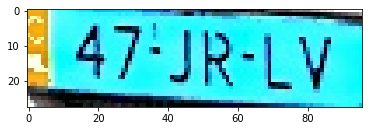

Plates found: ['L47-JR-LV', '47-JR-LV']
47-JR-LV
Max accuracy: 1.0
Speed: 4.873

../Dataset/TesseractEvaluation/evaluation/model_3/045.jpg


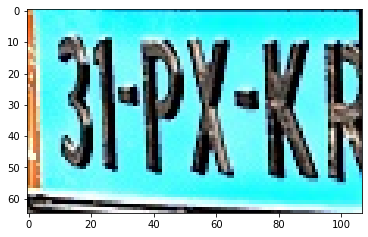

Plates found: ['3IP1HI', '3IPI-KF', '3IPIKF', '3IP1-KF', '3IP1-HI']
31-PX-KR
Max accuracy: 0.5
Speed: 5.535

../Dataset/TesseractEvaluation/evaluation/model_3/049.jpg


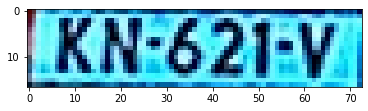

Plates found: ['KH-621V', 'KN-621-V', 'KN-6Z1-V', 'KN-6Z21V', 'KN-621V-I', 'KN-521V']
KN-621-V
Max accuracy: 1.0
Speed: 4.646

../Dataset/TesseractEvaluation/evaluation/model_3/050.jpg


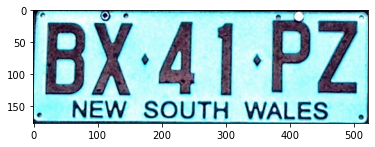

Plates found: ['BX-41-PZ', 'BX-4-1-PZ']
BX-41-PZ
Max accuracy: 1.0
Speed: 19.456

../Dataset/TesseractEvaluation/evaluation/model_3/051.jpg


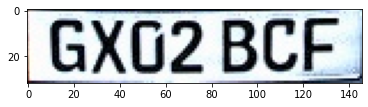

Plates found: ['GXUZ-BCFE-J', 'GX02-BCF', 'GX0Z-BCF-J', 'GX02-BCF-J']
GX02 BCF
Max accuracy: 1.0
Speed: 6.516

../Dataset/TesseractEvaluation/evaluation/model_3/052.jpg


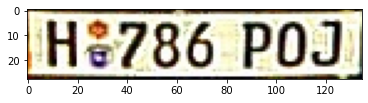

Plates found: ['H8786-P0J-I', 'H3786-P0J-J', 'HS786-P0J', 'H8786-P0J', 'H8786-P0JI', 'H3786-PDJ1', 'IH8786-PDJI', 'IH8786-P0JI']
H 786 POJ
Max accuracy: 0.8
Speed: 9.335

Average time: 6.215388888888886
Average accuracy: 0.7409771181199754


In [68]:
Tesseract_Complete_Evaluation(r"model_3/", lang="plate_model_4")

../Dataset/TesseractEvaluation/evaluation/model_3/000.jpg


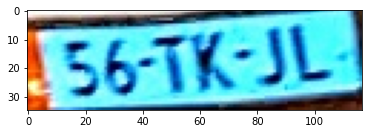

Plates found: ['S61K3L', 'LS61K3L', 'S61K-SL', 'TS61K-SL', 'So-1K3L', 'S61K-JL', 'S56-TKSL']
56-TK-JL
Max accuracy: 0.7692307692307693
Speed: 5.207

../Dataset/TesseractEvaluation/evaluation/model_3/002.jpg


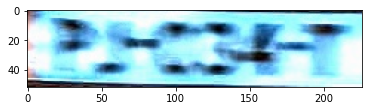

Plates found: ['t-dats-2']
PJ-034-T
Max accuracy: 0.0
Speed: 6.736

../Dataset/TesseractEvaluation/evaluation/model_3/003.jpg


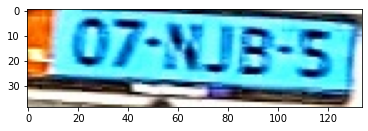

Plates found: ['O7NIB5', 'LO7NIBS', 'O7NIE5', 'a-O7MIR57', 'a-O7NISS', '3-O7NIBS', 'BO7NI85']
07-NJB-5
Max accuracy: 0.6666666666666666
Speed: 6.241

../Dataset/TesseractEvaluation/evaluation/model_3/004.jpg


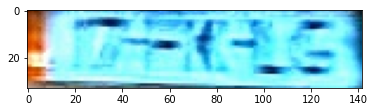

Plates found: ['Stress', 'Sta-SIS', 'eae-GIS']
17-HK-LG
Max accuracy: 0.16666666666666666
Speed: 5.115

../Dataset/TesseractEvaluation/evaluation/model_3/005.jpg


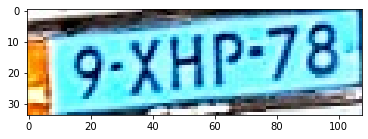

Plates found: ['it-9XHP78', 'i9XHP78', '9xHP78', 'i9xHP78', 'it-9xHP78', 'i-9XHP78', 'i-9xHP78']
9-XHP-78
Max accuracy: 0.9230769230769231
Speed: 4.658

../Dataset/TesseractEvaluation/evaluation/model_3/006.jpg


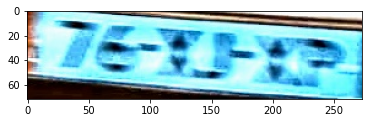

Plates found: ['PT-EF-TED', '2EFR-ED']
76-XJ-XP
Max accuracy: 0.15384615384615385
Speed: 7.043

../Dataset/TesseractEvaluation/evaluation/model_3/007.jpg


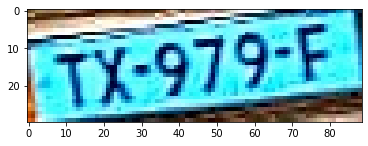

Plates found: ['TK-97-9E', 'Ap-aykes']
TX-979-F
Max accuracy: 0.6666666666666666
Speed: 5.14

../Dataset/TesseractEvaluation/evaluation/model_3/009.jpg


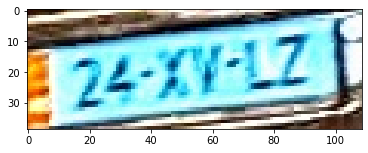

Plates found: ['Poe-kt2h', 'Poe-rei-Zh', 'PoecriZh', 'Poerilt', 'PoeriiZh', 'Pet-iZh', 'Perr-lh']
24-XV-LZ
Max accuracy: 0.16666666666666666
Speed: 6.001

../Dataset/TesseractEvaluation/evaluation/model_3/011.jpg


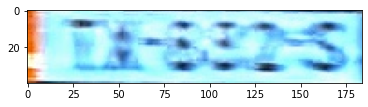

Plates found: ['PE-kaeczs', 'PE-SS27S', 'Ee-SoT-S']
TX-882-S
Max accuracy: 0.3333333333333333
Speed: 6.511

../Dataset/TesseractEvaluation/evaluation/model_3/012.jpg


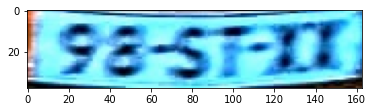

Plates found: ['S6STXd', 'SESeXt', 'S8SFit', 'SESTXd', '5-ES7IT', 'SES7XT']
98-ST-XX
Max accuracy: 0.5
Speed: 6.604

../Dataset/TesseractEvaluation/evaluation/model_3/013.jpg


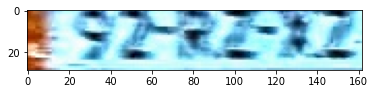

Plates found: ['wie-vig-4', 'wig-tap-Ve', 'wl-tig-Fa', 'pi-ag-Cag-F4', 'et-ae-tie-Fa', 'fm-fap-FA', 'et-ete-Fi', 'pig-7-FA', 'pi-ag-tag-2']
92-RZ-XZ
Max accuracy: 0.14285714285714285
Speed: 5.863

../Dataset/TesseractEvaluation/evaluation/model_3/014.jpg


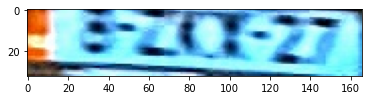

Plates found: ['24-8-P22', '24-8-Van']
8-ZKX-27
Max accuracy: 0.3333333333333333
Speed: 5.924

../Dataset/TesseractEvaluation/evaluation/model_3/015.jpg


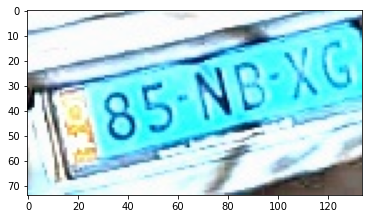

Plates found: []
85-NB-XG
../Dataset/TesseractEvaluation/evaluation/model_3/016.jpg


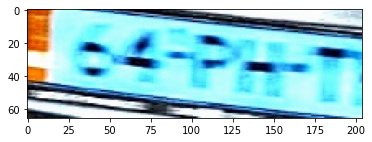

Plates found: []
64-PH-T
../Dataset/TesseractEvaluation/evaluation/model_3/017.jpg


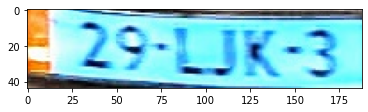

Plates found: ['S-29LIK2', 'S-29LIK3', 'B-2S-ik-3', 'S-251-K23', 'BS-25LIK2', 'E-2SL-K23']
29-LJK-3
Max accuracy: 0.7692307692307693
Speed: 5.599

../Dataset/TesseractEvaluation/evaluation/model_3/018.jpg


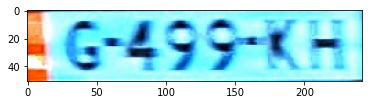

Plates found: ['G499KH', 'AG4554', 'AG4995KH', 'AG495K']
G-499-KH
Max accuracy: 1.0
Speed: 6.427

../Dataset/TesseractEvaluation/evaluation/model_3/019.jpg


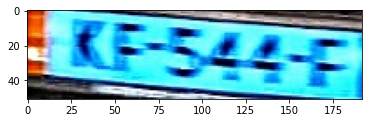

Plates found: ['KFS-420', 'KFS227', 'S-KFS-420', 'S-CFS-ee', 'S-KFS4e', 'SES-eee', 'Sk-ESeer']
KF-544-F
Max accuracy: 0.5
Speed: 7.318

../Dataset/TesseractEvaluation/evaluation/model_3/020.jpg


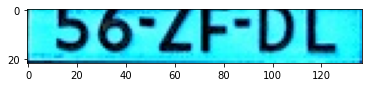

Plates found: ['2OLETVL', 'VOLE-VL', 'wOLrUL', 'SOLE-UL', 'wOvLF-UL', 'POLE-UL', 'WOLFE-UL', 'OLZF-VL', '2OLEVL']
56-ZF-DL
Max accuracy: 0.5
Speed: 4.581

../Dataset/TesseractEvaluation/evaluation/model_3/022.jpg


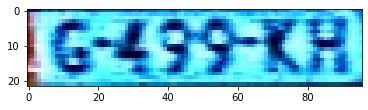

Plates found: ['6455KH', 'C43537KH', 'ea-oe-tn', 'tS-ere-433', 'iS45S7ERH']
G-499-KH
Max accuracy: 0.5
Speed: 4.547

../Dataset/TesseractEvaluation/evaluation/model_3/024.jpg


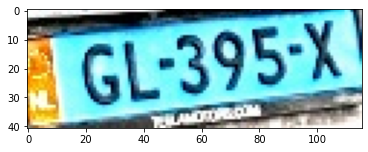

Plates found: ['A-GLS7-ok', 'A-GL395', 'A-GL39S', 'AGL-39S', 'a-GL39S', 'AGL-39o']
GL-395-X
Max accuracy: 0.8333333333333334
Speed: 5.155

../Dataset/TesseractEvaluation/evaluation/model_3/026.jpg


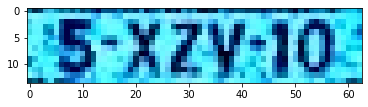

Plates found: ['Ere-tik', 'Bo-7410', 'BX-FUIO', 'Be-7410', '8-F4f4-0']
5-XZY-10
Max accuracy: 0.3333333333333333
Speed: 4.776

../Dataset/TesseractEvaluation/evaluation/model_3/027.jpg


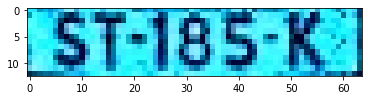

Plates found: ['ST125K', 'Sib-SKei', 'Sti8SKi', 'SF185K', 'ST185K']
ST-185-K
Max accuracy: 1.0
Speed: 5.83

../Dataset/TesseractEvaluation/evaluation/model_3/028.jpg


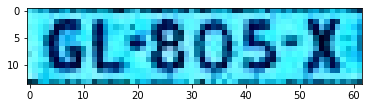

Plates found: ['GLB05K', 'GLBO51', '6L3605', 'GU8050', '6U805X']
GL-805-X
Max accuracy: 0.6666666666666666
Speed: 4.215

../Dataset/TesseractEvaluation/evaluation/model_3/029.jpg


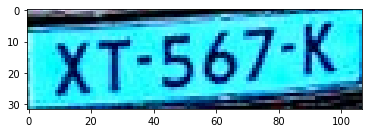

Plates found: ['XT-567K', 'XT567K', 'X15-677K', 'XT5-677K']
XT-567-K
Max accuracy: 1.0
Speed: 4.777

../Dataset/TesseractEvaluation/evaluation/model_3/031.jpg


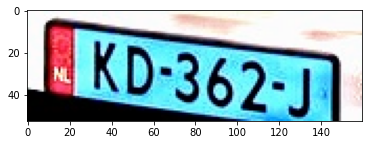

Plates found: ['Bo36a7', 'CORSET', 'BKD363', 'BO36a7', 'LORS-a7']
KD-362-J
Max accuracy: 0.6666666666666666
Speed: 5.494

../Dataset/TesseractEvaluation/evaluation/model_3/034.jpg


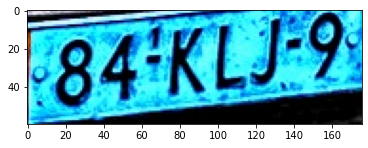

Plates found: ['LB-4KLJ2', 'LB-4KLI2', 'CB-4iKLI-2', 'LB4KLI', 'L84KLI', 'B4KLJ7', 'LB4K-La-2', 'LB4KLJ']
84-KLJ-9
Max accuracy: 0.6666666666666666
Speed: 8.143

../Dataset/TesseractEvaluation/evaluation/model_3/035.jpg


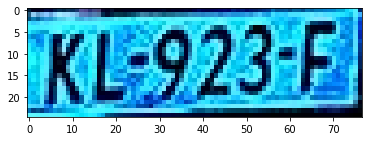

Plates found: ['Ki2923Ei', 'KE9236', 'Kl2923', 'KlE923E', 'KiE973F', 'KiS9236', 'KB209363', 'K1E923Fe', 'Kls9236', 'KiLs023Fi']
KL-923-F
Max accuracy: 0.7142857142857143
Speed: 4.742

../Dataset/TesseractEvaluation/evaluation/model_3/036.jpg


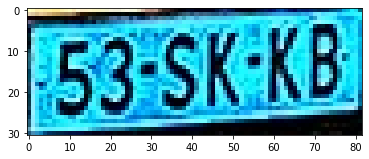

Plates found: ['CS-3SKAB', 'BSSKAR', 'PROsSKKE', 'SSSKAR', 'BSSKAB', '5-3SKAB', '53SKAB', 'BOSKKE']
53-SK-KB
Max accuracy: 0.8333333333333334
Speed: 4.854

../Dataset/TesseractEvaluation/evaluation/model_3/037.jpg


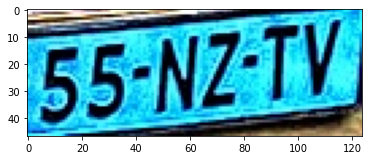

Plates found: ['55NZTV', 'BSNZ1V', '5SNZIV', '5SNZTV', 'BSNZIV', 'BSNZTV']
55-NZ-TV
Max accuracy: 1.0
Speed: 5.197

../Dataset/TesseractEvaluation/evaluation/model_3/041.jpg


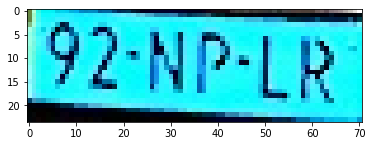

Plates found: ['92NPLR', 'SENPLR', '92NPHLR', 'S2NPLR']
92-NP-LR
Max accuracy: 1.0
Speed: 4.712

../Dataset/TesseractEvaluation/evaluation/model_3/042.jpg


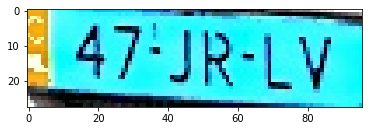

Plates found: ['1-47-IRLY', '1-47IRLY', 'S47-IRLY', '8-47JRLY', 'S-47JRLY', '8-47IRLY', '8-47-JRLY']
47-JR-LV
Max accuracy: 0.7692307692307693
Speed: 4.374

../Dataset/TesseractEvaluation/evaluation/model_3/045.jpg


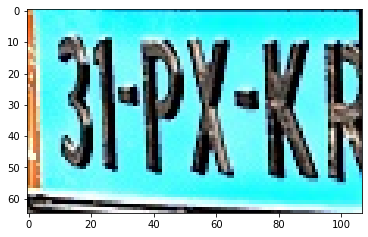

Plates found: []
31-PX-KR
../Dataset/TesseractEvaluation/evaluation/model_3/049.jpg


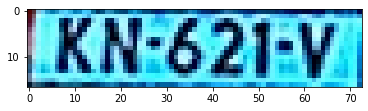

Plates found: ['i-KNS621', 'KNS621', 'ANS-21Y']
KN-621-V
Max accuracy: 0.8333333333333334
Speed: 4.536

../Dataset/TesseractEvaluation/evaluation/model_3/050.jpg


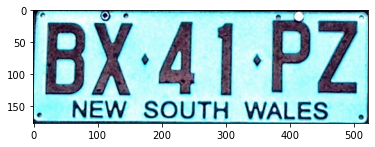

Plates found: ['BX41PZ']
BX-41-PZ
Max accuracy: 1.0
Speed: 18.031

../Dataset/TesseractEvaluation/evaluation/model_3/051.jpg


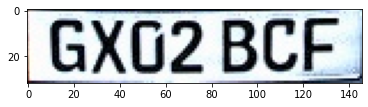

Plates found: ['GXO2-BCE-', 'GXG2-BCE-', 'GXG2-BCE', 'GXO2-BCE', 'GX62-BCE', 'GXGO2-BCE-']
GX02 BCF
Max accuracy: 0.7142857142857143
Speed: 4.766

../Dataset/TesseractEvaluation/evaluation/model_3/052.jpg


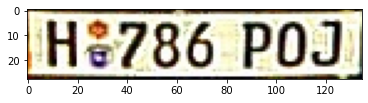

Plates found: ['H786-POT', 'HS786-PO', '1H8786-PO', 'He786-PO', 'HE786-POJ', 'tHE786-PO', 'H786-POJ', 'HS786-POD']
H 786 POJ
Max accuracy: 1.0
Speed: 4.66

Average time: 6.003277777777778
Average accuracy: 0.64008214008214


In [13]:
Tesseract_Complete_Evaluation(r"model_3/", lang="eng")

# TesserOCR

../Dataset/TesseractEvaluation/evaluation/model_3/000.jpg


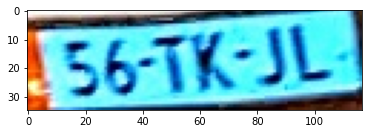

Plates found: ['SZ EZ', '5', 'E848', 'F8804BSAU', 'SEZ ZL', 'SZ ZU', 'SB ZZ', '8848S', 'JSAW0AU']
56-TK-JL
Max accuracy: 0.2857142857142857
Speed: 4.276

../Dataset/TesseractEvaluation/evaluation/model_3/002.jpg


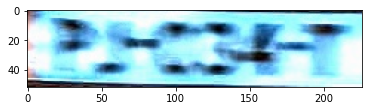

Plates found: ['LZ ZW ZZ', 'UZ 7 AZZ XO', 'UZ 7 QZ OI', 'LCZ AZZ', 'LZZ ZZ', 'LCGZ AZ AZ', 'GZS ZZ', 'ZZ ZZ', 'UZ 7 ZZ', 'ZS ZZ']
PJ-034-T
Max accuracy: 0.0
Speed: 5.061

../Dataset/TesseractEvaluation/evaluation/model_3/003.jpg


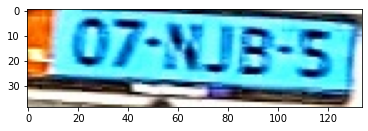

Plates found: ['', 'SZ EZ', 'ZL', '1', 'ZC', 'SEZ', 'OE', 'EC']
07-NJB-5
Max accuracy: 0.0
Speed: 4.737

../Dataset/TesseractEvaluation/evaluation/model_3/004.jpg


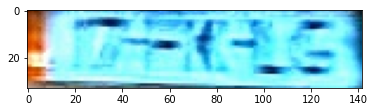

Plates found: ['9', '4', 'EQ AZ', 'ACW 9A', 'AWA AS', 'ZW 6 A', 'ZW 9 A2', 'WZ G2', 'LEW 9 AZ', 'ZW ZA']
17-HK-LG
Max accuracy: 0.2
Speed: 4.573

../Dataset/TesseractEvaluation/evaluation/model_3/005.jpg


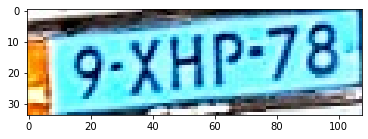

Plates found: ['JZ588GE', 'ZL', 'ZZ', 'ZEB', 'ECB', '5Z588GE', 'CD', '5AC58B']
9-XHP-78
Max accuracy: 0.16666666666666666
Speed: 4.438

../Dataset/TesseractEvaluation/evaluation/model_3/006.jpg


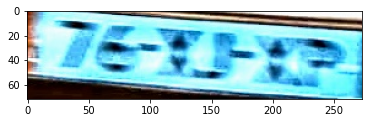

Plates found: ['BZ', 'L602OPZ', 'U ZWD', 'LZ CX', 'ZG', 'LBZ CX', 'LZ WD', 'ZX', 'LZ DX', 'L680 OFZ']
76-XJ-XP
Max accuracy: 0.3076923076923077
Speed: 6.161

../Dataset/TesseractEvaluation/evaluation/model_3/007.jpg


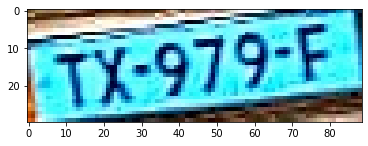

Plates found: ['PD', 'KZ', 'ZZ', 'EZ', 'XG', 'DZ', 'PRG GZ', 'LE', 'PKG']
TX-979-F
Max accuracy: 0.25
Speed: 4.164

../Dataset/TesseractEvaluation/evaluation/model_3/009.jpg


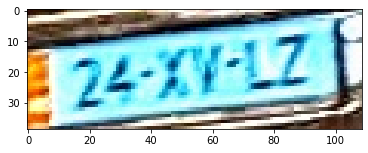

Plates found: ['', 'BZ', 'LU', 'DZ', 'ZU']
24-XV-LZ
Max accuracy: 0.25
Speed: 4.338

../Dataset/TesseractEvaluation/evaluation/model_3/011.jpg


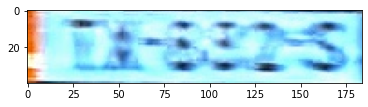

Plates found: ['JTE0Z SS', '7', 'JTS S6ZAS', 'EZ', 'JTZ6 S6ZAS', 'JE', 'JZ SZ', 'S1LELAZCZL', 'J72 6 S6ZS', 'JTZE SAQA']
TX-882-S
Max accuracy: 0.3076923076923077
Speed: 4.798

../Dataset/TesseractEvaluation/evaluation/model_3/012.jpg


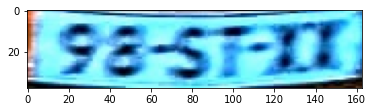

Plates found: ['LZ8S2XW', 'LE8A2XW', 'LEB SPS', 'L28AS20W', 'JEEZ', 'L2SAS2Z06', 'LEZBAFZ', 'JE', 'LE8AS2W', 'LZ8A7FXW']
98-ST-XX
Max accuracy: 0.46153846153846156
Speed: 4.907

../Dataset/TesseractEvaluation/evaluation/model_3/013.jpg


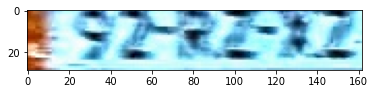

Plates found: ['ETSZZSZZCZZ', 'F XWZWTGQXG6', 'ETSZZAZZZ', 'ETZZACZAZZ', 'E1ZZSZ ZZ', 'AST ZZ', 'ET2ZA ZT8 Z', 'ETSZTG0TEZ', 'ET2ZGZT8Z', 'ETSZTAZSZZ']
92-RZ-XZ
Max accuracy: 0.4
Speed: 4.688

../Dataset/TesseractEvaluation/evaluation/model_3/014.jpg


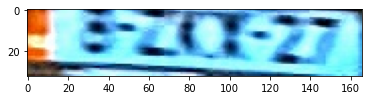

Plates found: ['ZZ ZY', 'ZZ FZYT', 'AZ XW SZ SZ', 'LA ZZ ZY', 'AWS SZ', 'LA ZZEZ2ZY', 'LZ ZZ ZY', 'ZZ E2ZY', 'LZ ZY', 'LE ZY']
8-ZKX-27
Max accuracy: 0.3333333333333333
Speed: 4.558

../Dataset/TesseractEvaluation/evaluation/model_3/015.jpg


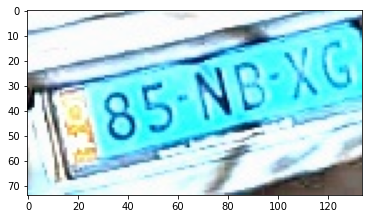

Plates found: ['DL', 'SU', 'A', 'DZ', 'QS', 'D1']
85-NB-XG
Max accuracy: 0.0
Speed: 5.49

../Dataset/TesseractEvaluation/evaluation/model_3/016.jpg


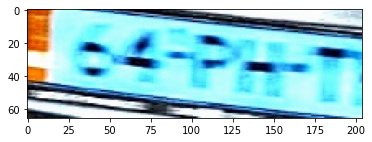

Plates found: ['4SSCC', '4SASCC', '49SSZ1C', 'QZ 6SCC', 'ZV', 'Q8CC', '4SSZIC']
64-PH-T
Max accuracy: 0.2
Speed: 5.361

../Dataset/TesseractEvaluation/evaluation/model_3/017.jpg


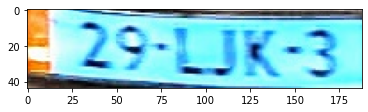

Plates found: ['LZ MB2S', 'L6SZ38B7S', 'L6SLEH87S', 'L26LET0TS', 'L6ESZJ8B7S', 'L6SLFH87S', 'L6SZ387S', 'L6ZLE48TS', 'L6ESZJ87S', 'L8ZZB7S']
29-LJK-3
Max accuracy: 0.2857142857142857
Speed: 5.007

../Dataset/TesseractEvaluation/evaluation/model_3/018.jpg


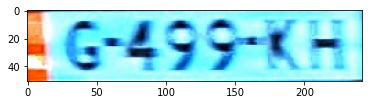

Plates found: ['88 A22 AT', '88466 BH', '818 S22 ST', '88 S22 ZT', '88 A422 ST', '88S A22 AT', '5S A29S BT', '5S ASS BH', '8S ASS6 BH', '88AS6Z BH']
G-499-KH
Max accuracy: 0.3076923076923077
Speed: 5.864

../Dataset/TesseractEvaluation/evaluation/model_3/019.jpg


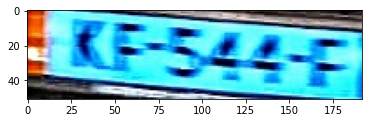

Plates found: ['ZL', 'ZC', 'LZ', 'LE KX', 'LE', 'EB', 'ZU', 'L8Z CW']
KF-544-F
Max accuracy: 0.2
Speed: 5.258

../Dataset/TesseractEvaluation/evaluation/model_3/020.jpg


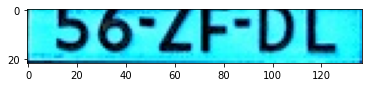

Plates found: ['1002ZFYU 1', '1G02AFYKL 1', '1E0CZZCFY 1', '1000AFYUL 1', 'LE06SCPEYPL 1', '1A02AFYUL 1', '1002ZCFYU 1', 'J1002AFYUL 1', '1GA0C2AFYKL 1', 'LEBA00CPYLPL 1']
56-ZF-DL
Max accuracy: 0.26666666666666666
Speed: 4.215

../Dataset/TesseractEvaluation/evaluation/model_3/022.jpg


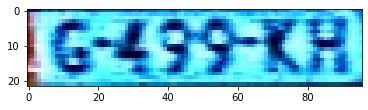

Plates found: ['JE AB', 'JES', 'IEA', 'J8A566WR', 'JBEA56GR', 'J8G2XWB0R', 'JE', 'J8BA8', 'BQ 6ZSSU']
G-499-KH
Max accuracy: 0.14285714285714285
Speed: 4.034

../Dataset/TesseractEvaluation/evaluation/model_3/024.jpg


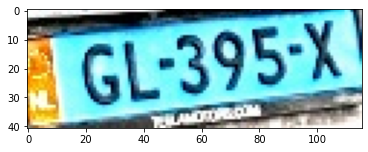

Plates found: ['', 'DZ', 'LZ']
GL-395-X
Max accuracy: 0.25
Speed: 4.486

../Dataset/TesseractEvaluation/evaluation/model_3/026.jpg


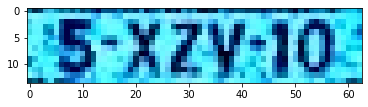

Plates found: ['BQ AGE', 'RQX8888G', 'A288S6088B4', 'A28BS58B', 'I8E28B6S58I', 'A288S60R8B4', 'X58ES88G', 'QG8888BG', 'X58BES88BS', '5828862581']
5-XZY-10
Max accuracy: 0.25
Speed: 3.956

../Dataset/TesseractEvaluation/evaluation/model_3/027.jpg


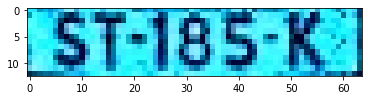

Plates found: ['62G8B8F88', 'L82X8STRK1', '632G8B82S5', 'L82238STRK1', 'L8E3P58SS2', '0CSBL0QA', 'L83P5882RK2', '64X8B8S2', 'L832P8S2RK2', '6368SS2']
ST-185-K
Max accuracy: 0.375
Speed: 4.035

../Dataset/TesseractEvaluation/evaluation/model_3/028.jpg


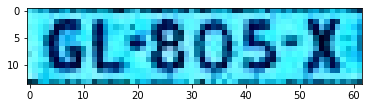

Plates found: ['8ED888S', '8ZEE0888X', 'BEEBE', 'BEE', '8ED888Z', 'EEE', 'BEE08B82Z', 'Z0E8882S', 'BEPM68B82Z']
GL-805-X
Max accuracy: 0.4
Speed: 3.854

../Dataset/TesseractEvaluation/evaluation/model_3/029.jpg


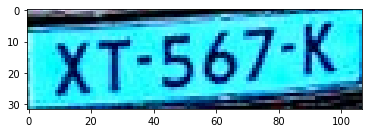

Plates found: ['ED', '84888', '9880S', 'O80', '82L86SZS', '98880', 'T82L8SZZ', 'T82L8SEZ', 'W888']
XT-567-K
Max accuracy: 0.14285714285714285
Speed: 5.286

../Dataset/TesseractEvaluation/evaluation/model_3/031.jpg


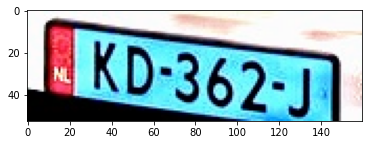

Plates found: ['SDT', 'BE ZT', 'EE J5T', 'J', 'BE 0C3']
KD-362-J
Max accuracy: 0.2857142857142857
Speed: 5.792

../Dataset/TesseractEvaluation/evaluation/model_3/034.jpg


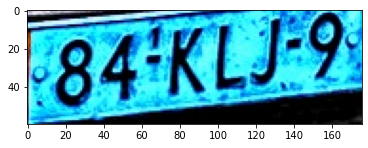

Plates found: ['1', '8G', '8SSG', '8S8EG', '8SSBG', '8S8B0', '8SSE88', 'DZ', '8S']
84-KLJ-9
Max accuracy: 0.25
Speed: 6.455

../Dataset/TesseractEvaluation/evaluation/model_3/035.jpg


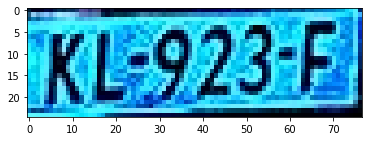

Plates found: ['1', 'LD', '58RQ8SS', 'LZ', '8B ESS', 'DZ', '58RQ8SSZ', '5RQ8SS']
KL-923-F
Max accuracy: 0.25
Speed: 4.344

../Dataset/TesseractEvaluation/evaluation/model_3/036.jpg


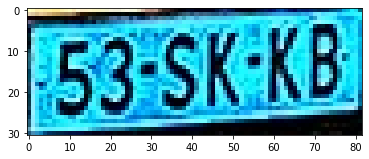

Plates found: ['1', 'DE', 'DD', 'DL', '8B', '8880', '888', '88880']
53-SK-KB
Max accuracy: 0.25
Speed: 5.051

../Dataset/TesseractEvaluation/evaluation/model_3/037.jpg


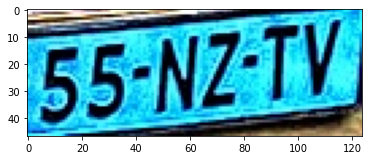

Plates found: ['DE', 'DD', 'LZ', 'S88', 'SSE', '88S', 'LE', '8S']
55-NZ-TV
Max accuracy: 0.25
Speed: 4.633

../Dataset/TesseractEvaluation/evaluation/model_3/041.jpg


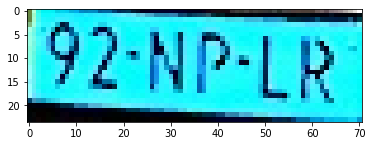

Plates found: ['SZ88E8', '8E8EI8', 'SSZ88E8', '6ZE8EE8', 'SZE80E8', '888028', '0G 8EI8', 'SZ8EE8', 'GC8828']
92-NP-LR
Max accuracy: 0.16666666666666666
Speed: 3.631

../Dataset/TesseractEvaluation/evaluation/model_3/042.jpg


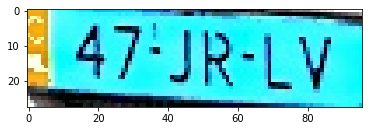

Plates found: ['S689', '3281S', '5238S', 'LS638JL9', 'LS608JJ9', '3238S', '6089', '6389']
47-JR-LV
Max accuracy: 0.2857142857142857
Speed: 3.81

../Dataset/TesseractEvaluation/evaluation/model_3/045.jpg


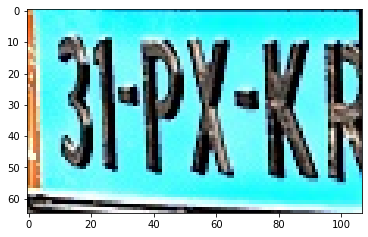

Plates found: ['859', '89', '855', '82', '856', '886', '852']
31-PX-KR
Max accuracy: 0.0
Speed: 4.49

../Dataset/TesseractEvaluation/evaluation/model_3/049.jpg


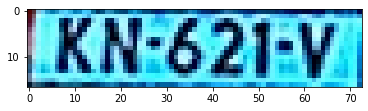

Plates found: ['BBCS8E08E', 'A', 'JBCS8PZ', 'LBB', 'ZZ', 'BBG8BRE', '8BBXG8BRE', 'JBBS8PZ', 'BCSS0Z']
KN-621-V
Max accuracy: 0.0
Speed: 3.778

../Dataset/TesseractEvaluation/evaluation/model_3/050.jpg


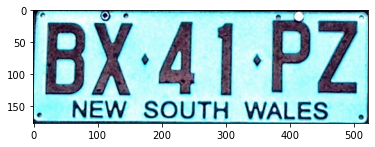

Plates found: ['B8 4 I B8', 'B8 4ILB8', '88SIL8E', '88SI BE', '88SILB']
BX-41-PZ
Max accuracy: 0.3333333333333333
Speed: 13.588

../Dataset/TesseractEvaluation/evaluation/model_3/051.jpg


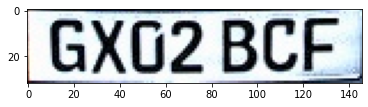

Plates found: ['1BR0BEBDEL', '1BR0BEBDE', '1BR0BEB0E', '1BR08BBDEL', '1BR0EBDE', '1BR0BEB0EL', '1BR08BBDE']
GX02 BCF
Max accuracy: 0.26666666666666666
Speed: 4.296

../Dataset/TesseractEvaluation/evaluation/model_3/052.jpg


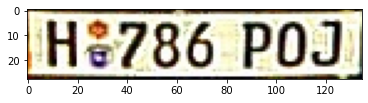

Plates found: ['RE08B1RBB8', 'JE08E881BR', 'Z8E80R1BB CZ', 'JE066E881BRQ', 'JR5Z8S1RRB49', '6Z8E88T1RB', 'JE086E881BRQ', 'J059881RB0', 'J059881RBB', 'JRK5Z881RRB4']
H 786 POJ
Max accuracy: 0.21052631578947367
Speed: 4.423

Average time: 4.939888888888889
Average accuracy: 0.23144573506415617


In [27]:
Tesseract_Complete_Evaluation(r"model_3/", lang="plate_model_4", tess=True)

Zoals te zien heeft TesserOCR een erg lage accuracy vergeleken met PyTesseract. Dit komt omdat de huidige TesserOCR versie gebruik maakt van Tesseract 4 ipv Tesseract 5. De versie van TesserOCR die wel gebruik maakt van Tesseract 5 heeft op het moment van schrijven geen support voor Windows. 